# Text classification for Audience review from Rotten Tomato - Web scraping

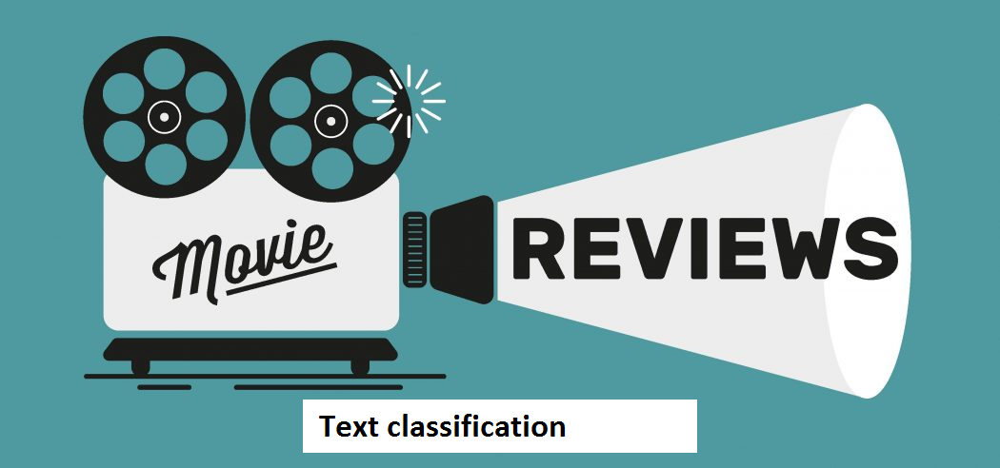

In [181]:
from IPython.display import display, Image
Image("D:\Data_science\moviereview.png")

##  Introduction on Reviews and Moview reviews
Online reviews are important because they have become a reference point for buyers across the globe and because so many people trust them when making purchase decisions.

Reviews are also important for Search Engine Optimization (SEO). Having positive reviews is also another way through which you can improve a website’s Search Engine visibility. The more that people talk about a brand online, the greater its visibility to Search Engines, such as Google, Yahoo and Bing.

For the audience and booking websites, analysing reviews is significant in understanding reviewer opinion about the film.

In movie booking websites, 90% of people first check out online reviews before purchasing tickets.


For the production house, analysing negative reviews can be useful for damage control.


# Problem Statement:

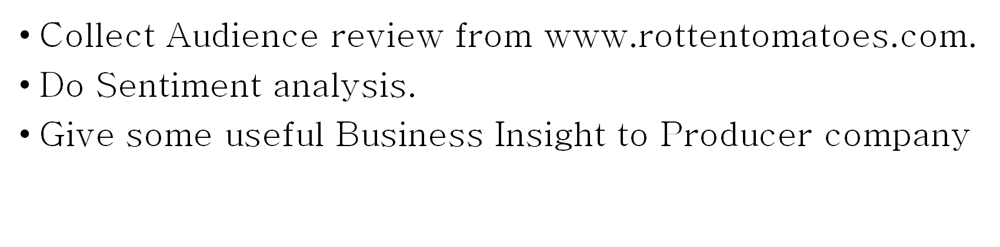


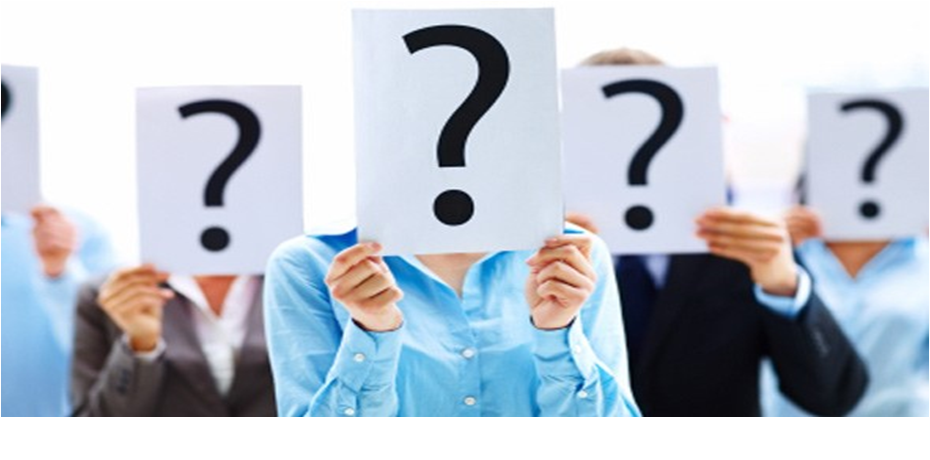

In [191]:
from IPython.display import display, Image
Image("D:\Data_science\PHD\client.png")

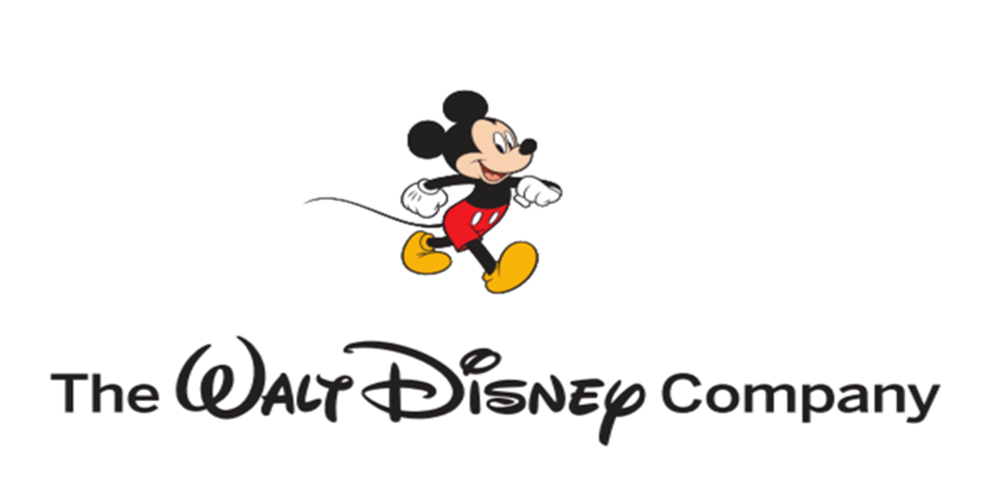

In [189]:
from IPython.display import display, Image
Image("D:\Data_science\PHD\waltdisney.png")


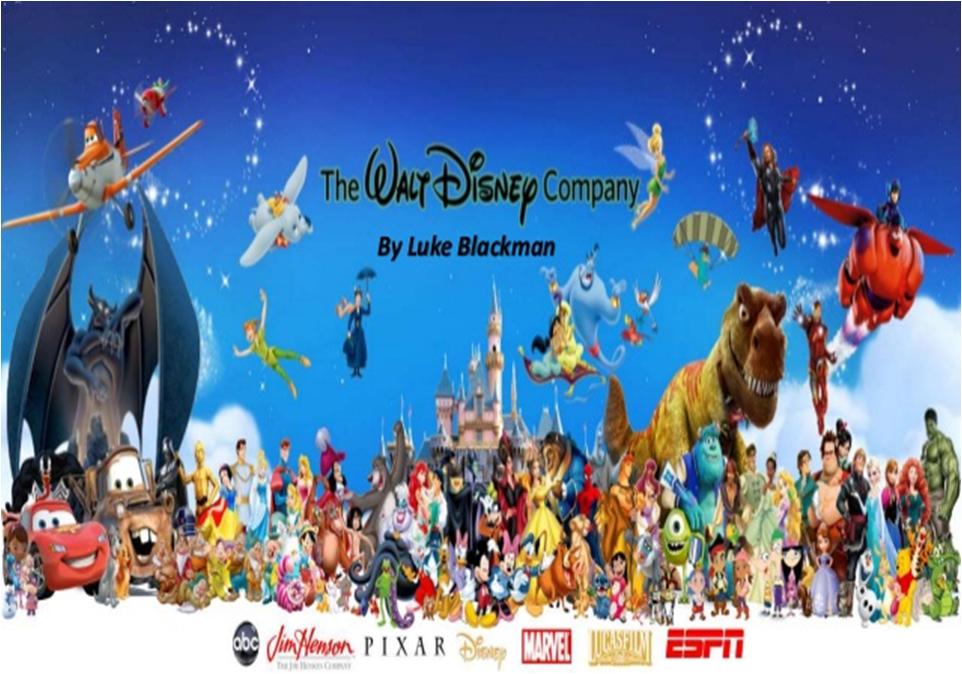

In [192]:
from IPython.display import display, Image
Image("D:\Data_science\PHD\waltdisneymovies.png")

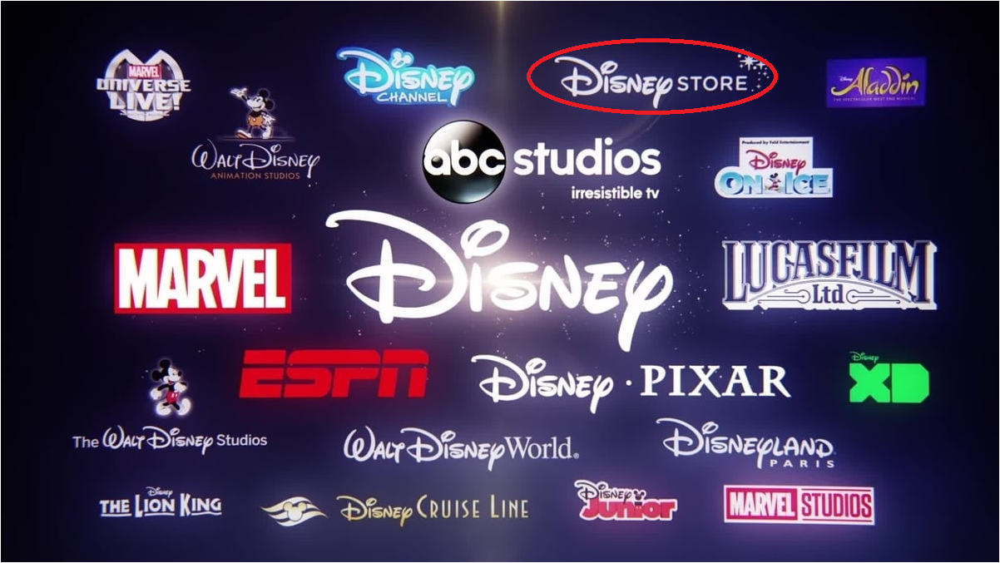

In [193]:
from IPython.display import display, Image
Image("D:\Data_science\PHD\disneyfamily.png")

## History about the client - The walt Disney
### Acquired studios/Production Houses:



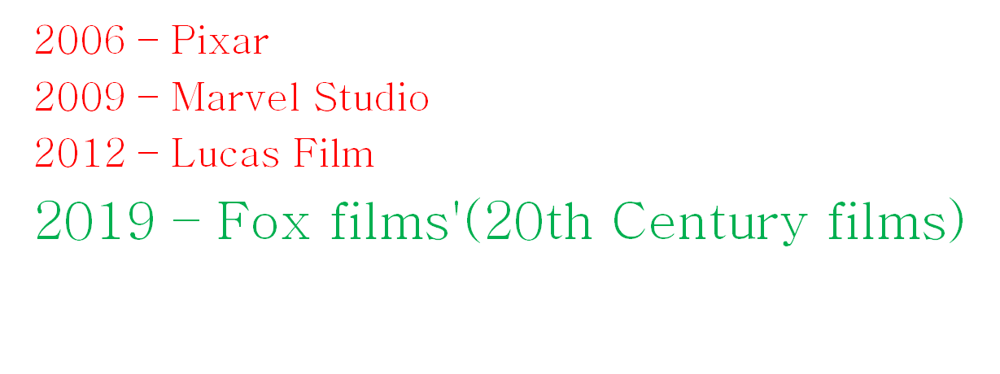

In [203]:
from IPython.display import display, Image
Image("D:\Data_science\PHD\companies.png")

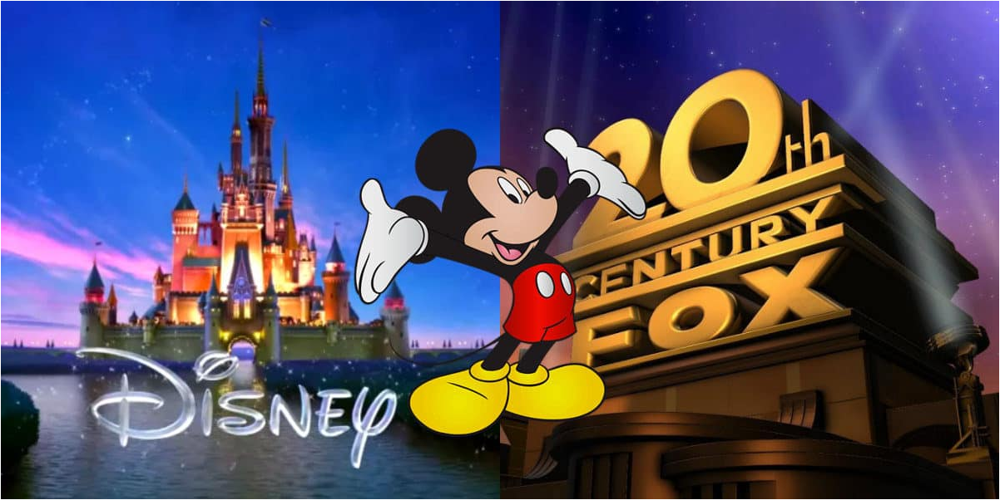

In [194]:
from IPython.display import display, Image
Image("D:\Data_science\PHD\disneyand20thcen.png")

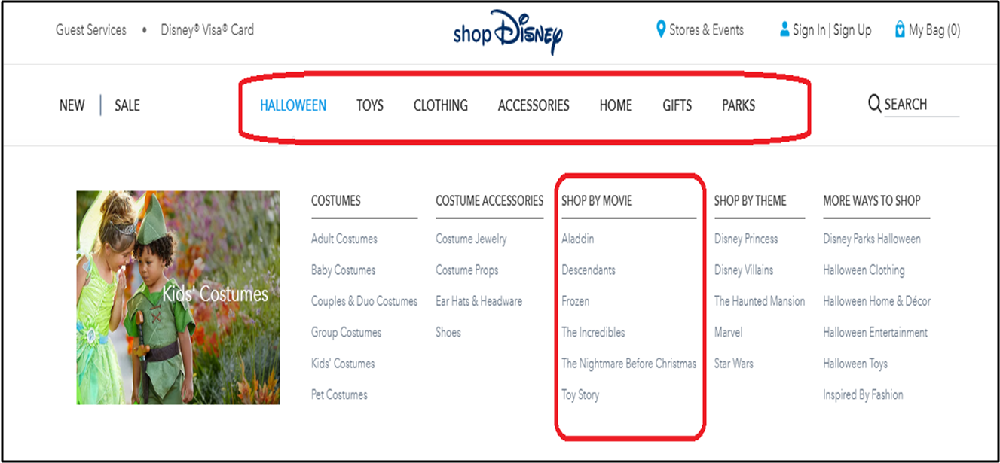

In [195]:
from IPython.display import display, Image
Image("D:\Data_science\PHD\disneystorewebsite.png")

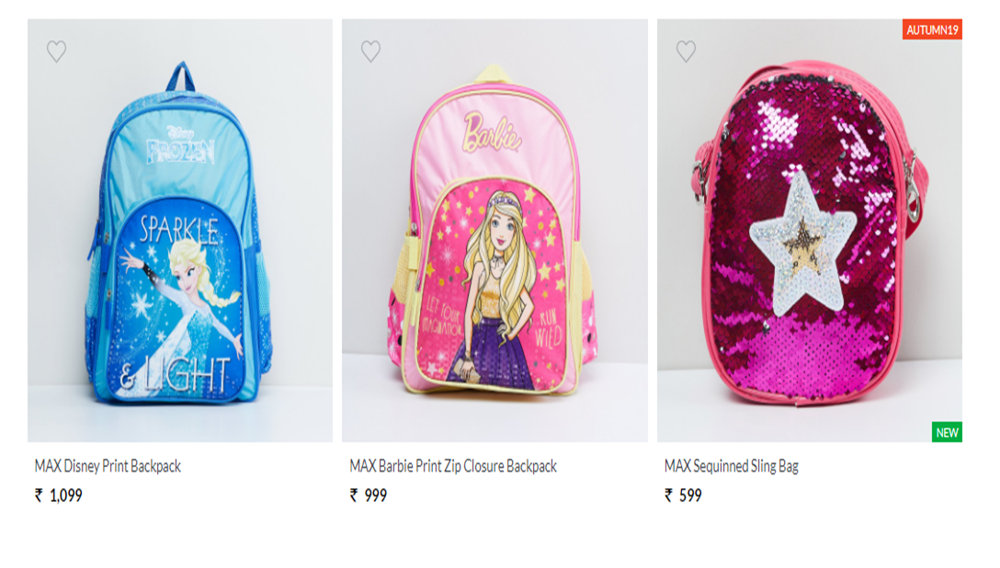

In [196]:
from IPython.display import display, Image
Image("D:\Data_science\PHD\disneyproducts.png")

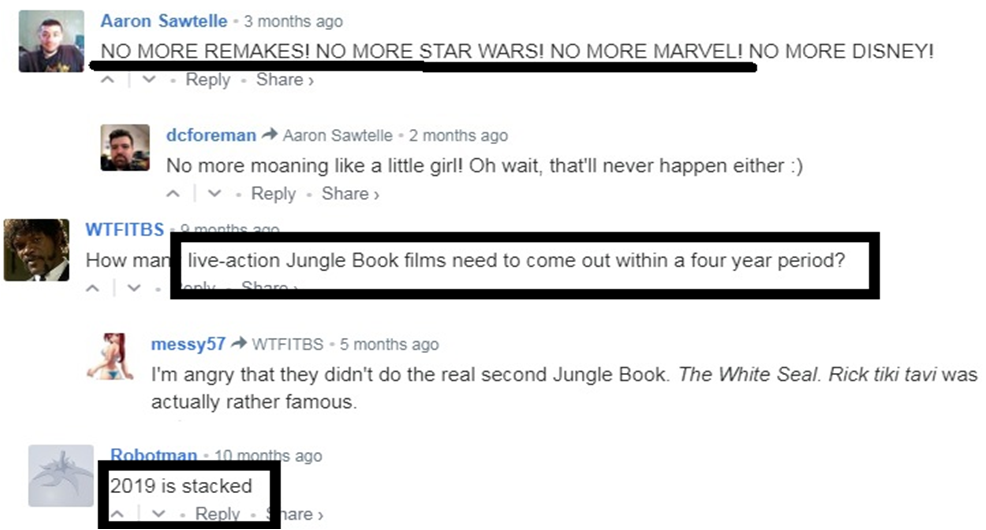

In [197]:
from IPython.display import display, Image
Image("D:\Data_science\PHD\someaudiencereviews.png")


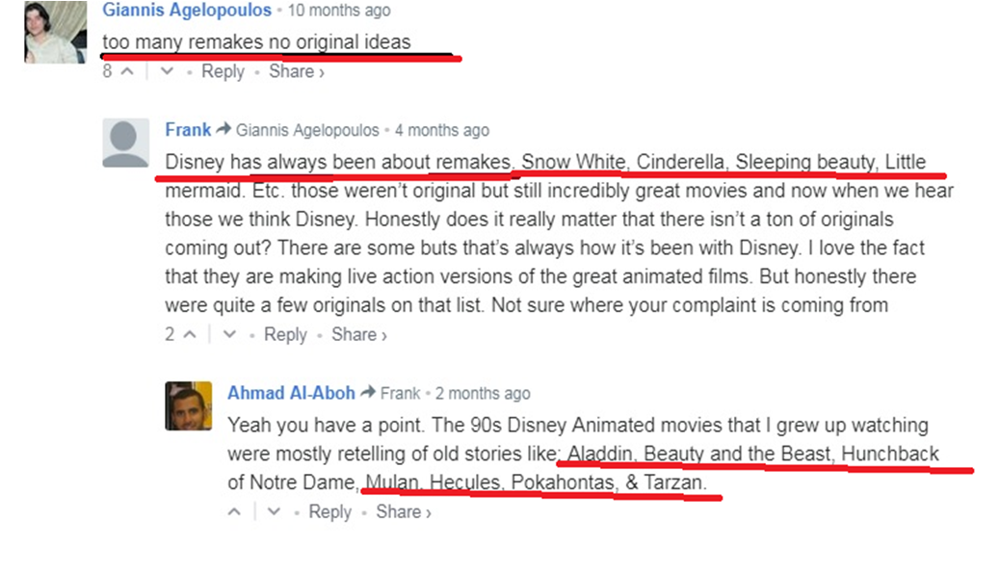

In [199]:
from IPython.display import display, Image
Image("D:\Data_science\PHD\someaudiencereviews2.png")


## FACTS about the client

Disney is well know for remake, Sequel movies and animation. 

Very successful in Animation movies

Not so successful in Live-Action movies

Usually Don’t release movie in Dec.

June-July is Jackpot month. They need to decide right combination of movies to release in June-July to meet the expectation and demand

They postpone the release date of few movies depends on the sentiment mix among audience.


## Previous release this year
Dumbo - Remake

Aladdin – Remake

Toy story 4- Sequel

EndGame - Avengers

The Lion King  - Remake

Artemis Fowl – New – Live action

## Upcoming movies this year

Mistress of Evil – Remake – Oct month

Frozen II – Sequel – Nov month

## Next year - Upcoming

Feb – Untitled Live action - New

Mar – Onward – Remake

Mar – Mulan – Live action – remake of animated version.

Jun – Monsters – Remake

July – Jungle Cruise – Remake(Initially planned in Oct 2019).

Oct – Untitled Live action - Sequel



### History about the Movie

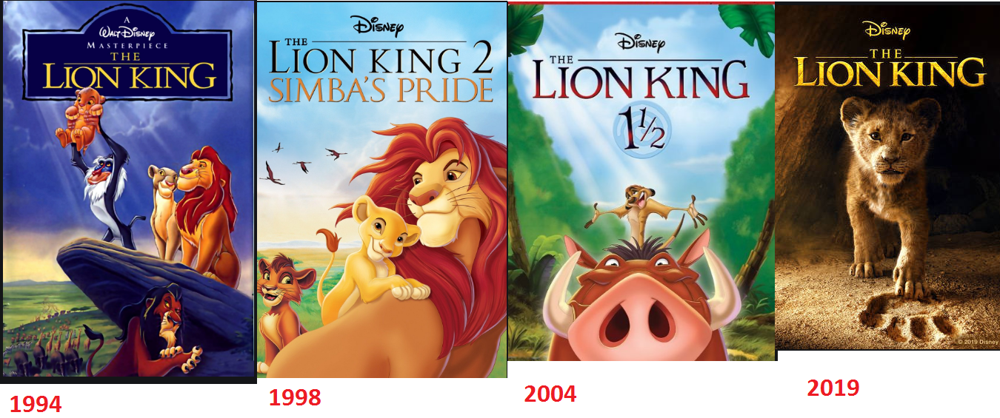

In [72]:
from IPython.display import display, Image
Image("D:\Data_science\PHD\lionkinghistory.png")

### Something New! 

Walt Disney started making CGI movies of old cartoon based movies. 
wanted to know how is the customer responses in their trial so far!!

# Business problem statement

## Expectation from Client 

## 1. Movie level :

Overall sentiment of Audience about movie. 

Frequently commented words to merchandise those words and themes. 

When they can plan Sequel of Lion King.

How will the overall sentiment be 

What they have to target

Any technical comments – Background music, song, voice.

Any sentiment comments – Violence, fights, pride, etc. 

#### TV license issue decision

## 2. Industry level :

Sentiment on CGI based movies 

Right mix of movies to release.

Should they focus on animation or Live action.

Do they need to reschedule any movie release in upcoming list. 

Upcoming movies – how they should advertise. 

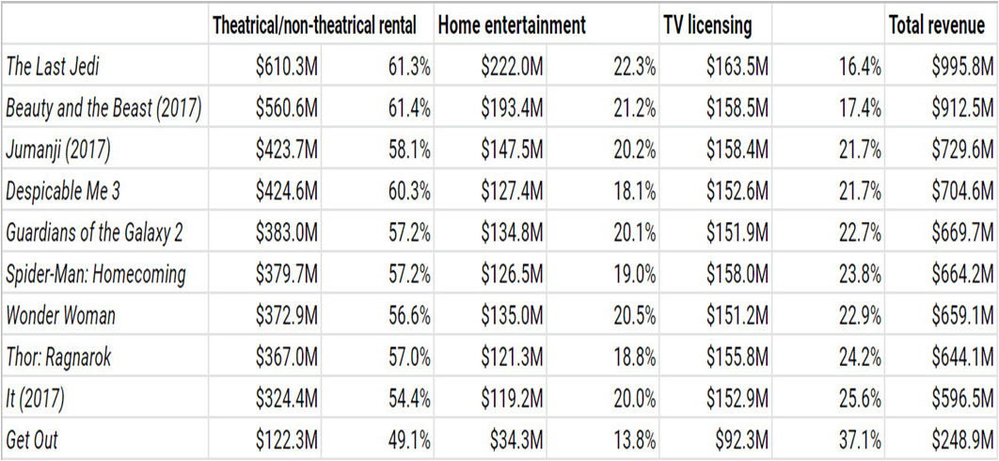

In [121]:
from IPython.display import display, Image
Image("D:\Data_science\PHD\TVlicensereview.png")

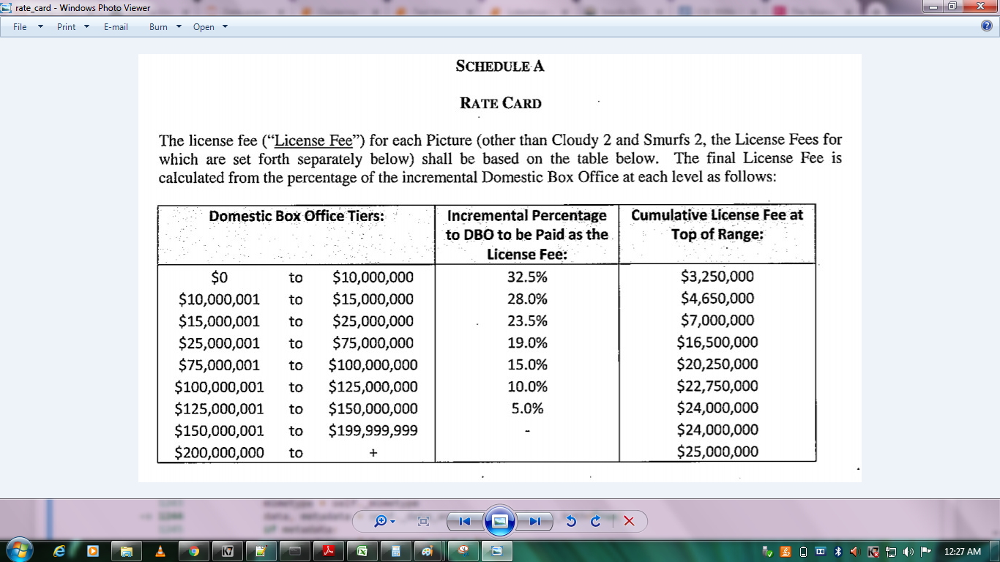

In [140]:
Image("D:\Data_science\PHD\licensefee.png")

### Business Question from above Images : 

Producer company makes decent above 20% of total revenue in TV Telecast license for the movie. 

They have to decide when they have to stop movies in theatres and issue TV license. 

This is important decision to make. 

## Analytical Approach to this Project:
    
### 1. Data Extraction - Web scrape

1. Web-scrape the data, save it into a CSV File
2. Read the data and create Sentiment column from Rating.

### 2. EDA_visualization_Feature engineering
1. Show distribution plot for each variable
2. Use Data attribute and get Weekday and Weekend features.
3. Show distribution plot for new features. 
4. Draw patterns towards target variable.
5. Explain insights on each plot and distribution

### 3. Review Text understanding/cleaning

Cleaning of Text:
1.	Apply Lower Case 
2.	Remove special characters
3.  Remove alpha numericals
4.  Remove punctuation marks
5.	Word Count.
6.	Check if words in a review.
7.	Convert Dictionary to DF.
8.	Stop words, stemming, Lemmatize
a.	Using spacy 
b.	Add customized stop words
c.	Use NLTK’s stemmer
d.	Tokenize
e.	Custom Stop words Removal
f.	Stemming

11.	Remove stop words from clean text datasets and run models.
12.	Plot the Text again
b.	Plot with stop words
c.	Plot frequency (Word Cloud)
13.	TF-IDF

#### 4. Build base model

#### 5. Vectorize the word - Review text

#### 6. Train test split

#### 7. Build models

#### 8. Compare models

#### 9. Predict on unseen data with best model. 

### 10. Clustering of review text for good and bad reviews. Business insight and suggestion.


# 1. Data Extraction 

Lets webscrape Audience review from Rotten Tomato for The Lion King Movie

### Loading Libraries


In [20]:
#Loading required Libraries
import requests
import time
import csv
import pandas as pd
import numpy as np

### Headers for our request

In [2]:
#Creating headers for our request
headers = {
'Referer': 'https://www.rottentomatoes.com/m/the_lion_king_2019/reviews?type=user',
'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/74.0.3729.108 Safari/537.36',
'X-Requested-With': 'XMLHttpRequest',
}

### RottenTomato API link to webscrape

In [3]:
#API link to webscrape from RottenTomato
url = 'https://www.rottentomatoes.com/napi/movie/9057c2cf-7cab-317f-876f-e50b245ca76e/reviews/user'

In [4]:
#Initial payload parameters to fetch data

payload = {
'direction': 'next',
'endCursor': '',
'startCursor': '',
}

In [5]:
#Creating a Session Object with Rotten Tomato API
sess = requests.Session()

In [6]:
# To fetch one-page reviews by using GET 
r = sess.get(url, headers=headers, params=payload) # GET Call
data = r.json()

In [7]:
#Creating Empty list for Page Info and Audience review to initiate Iteration
page_info = []
Audience_reveiws = []

### Extracting 3000 reviews from Rotten Tomato 

In [8]:
# To get 6000 reviews, calling GET for 600 times. 

for i in range(600):
    update_start = data.get('pageInfo').get('startCursor')
    update_end = data.get('pageInfo').get('endCursor')
    payload.update({'startCursor':update_start})
    payload.update({'endCursor':update_end})
    r = sess.get(url, headers=headers, params=payload) # GET Call
    data = r.json()
    page_info.append(data.get('pageInfo'))
    Audience_reveiws.append(data.get('reviews'))
    time.sleep(5)

JSONDecodeError: Expecting value: line 1 column 1 (char 0)

In [9]:
#To view received data
print(Audience_reveiws)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



### Assigning column Names for extracted data

In [10]:
# Create empty data frame with Reviewer ID, Reviewer name, Review, Rating, Date_of_Review columns
# Assign column names with respective columns

col_names =  ['ReviewID','Reviewer Name', 'Review', 'Rating' ,'Date_of_Review']
review_data = pd.DataFrame(columns = col_names)


In [11]:
# Add data to the data frame created

# len(Audience_reveiws) corresponds to total of 300 pages
for i in range(0, len(Audience_reveiws)):
    
    #len(Audience_reveiws[0]) corresponds to 10 ratings which will be displayed in single page
    for j in range(0,len(Audience_reveiws[0])):
        review_data = review_data.append({'ReviewID':Audience_reveiws[i][j].get('user').get('userId'),
                                  'Reviewer Name': Audience_reveiws[i][j].get('displayName'), 
                                  'Review': Audience_reveiws[i][j].get('review'), 
                                  'Rating': Audience_reveiws[i][j].get('score') , 
                                  'Date_of_Review':Audience_reveiws[i][j].get('createDate')},
                                 ignore_index=True)


In [12]:
#Check the shape of the review data
review_data.shape

(5950, 5)

In [13]:
#To view data with head of few lines
review_data.head()

,ReviewID,Reviewer Name,Review,Rating,Date_of_Review
0,9bd27314-fc78-41fe-ba69-42669bc763d4,kascam,Amazing cinematography! I don't know how they...,5,2019-08-22T23:52:03.870Z
1,966121979,Stephen M,I loved this movie \n,5,2019-08-22T23:50:08.574Z
2,75D441F3-4AE6-4447-9702-8EDD3BA4153A,William,It was pretty awesome...I was floored by the s...,4,2019-08-22T23:32:17.995Z
3,c7d41004-8ce5-46f7-ab89-b94d0c634bbe,MrsR,Brought my kids to the original ages ago. This...,5,2019-08-22T23:30:52.872Z
4,2c88353b-108c-436d-bb5f-6ab4f9bb8641,BRENT,I grew up watching this and my kids are now. T...,5,2019-08-22T23:22:03.957Z


### Exporting Review data to CSV file. (For Text Processing steps)

In [14]:
# Export data into csv file from the data frame


review_data.to_csv("audience_review.csv", sep=',', columns=['ReviewID','Reviewer Name', 'Review', 'Rating' ,'Date_of_Review'], header=True, index=False)

### Creating Sentiment column

In [23]:
#To Create New column "Sentiment" - If Rating is greater than 3, Positive Sentiment. If it is less than or equal to 3, Negative

review_data['Sentiment'] = np.where(review_data['Rating']>3, 'Pos','Neg')

In [24]:
#To view data with head of few lines to verify Sentiment column
review_data.head(3)

,ReviewID,Reviewer Name,Review,Rating,Date_of_Review,Sentiment
0,9bd27314-fc78-41fe-ba69-42669bc763d4,kascam,Amazing cinematography! I don't know how they...,5.0,2019-08-22T23:52:03.870Z,Pos
1,966121979,Stephen M,I loved this movie \n,5.0,2019-08-22T23:50:08.574Z,Pos
2,75D441F3-4AE6-4447-9702-8EDD3BA4153A,William,It was pretty awesome...I was floored by the s...,4.0,2019-08-22T23:32:17.995Z,Pos


# 2. EDA_Visulaization_FeatureEngineering

Lets us do some Explortory Data analysis and Data visualization


### Loading required Libraries

In [1]:
#Loading required Libraries 

import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


import re
from nltk.corpus import stopwords
from nltk import word_tokenize
STOPWORDS = set(stopwords.words('english'))
from bs4 import BeautifulSoup
import plotly.graph_objs as go
from sklearn.model_selection import train_test_split

from IPython.core.interactiveshell import InteractiveShell
import plotly.figure_factory as ff
InteractiveShell.ast_node_interactivity = 'all'
from plotly.offline import iplot

from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Dense, Embedding, LSTM, SpatialDropout1D

from keras.utils.np_utils import to_categorical
from keras.callbacks import EarlyStopping
from keras.layers import Dropout

Using TensorFlow backend.
C:\Users\Lokesh\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

C:\Users\Lokesh\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

C:\Users\Lokesh\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.

C:\Users\Lokesh\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:519: FutureWarning:

Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood a

### Reading Extracted data (Webscrapped from Rotten Tomato)

In [207]:
#Reading data 
data = pd.read_csv("audience_review.csv")

### Data Understanding

In [208]:
#To view data with head of few lines
data.head()

,ReviewID,Reviewer Name,Review,Rating,Date_of_Review
0,9bd27314-fc78-41fe-ba69-42669bc763d4,kascam,Amazing cinematography! I don't know how they...,5.0,2019-08-22T23:52:03.870Z
1,966121979,Stephen M,I loved this movie \n,5.0,2019-08-22T23:50:08.574Z
2,75D441F3-4AE6-4447-9702-8EDD3BA4153A,William,It was pretty awesome...I was floored by the s...,4.0,2019-08-22T23:32:17.995Z
3,c7d41004-8ce5-46f7-ab89-b94d0c634bbe,MrsR,Brought my kids to the original ages ago. This...,5.0,2019-08-22T23:30:52.872Z
4,2c88353b-108c-436d-bb5f-6ab4f9bb8641,BRENT,I grew up watching this and my kids are now. T...,5.0,2019-08-22T23:22:03.957Z


### Creating Sentiment column

In [209]:
#To Create New column "Sentiment" - If Rating is greater than 3, Positive Sentiment. If it is less than or equal to 3, Negative
data['Sentiment'] = np.where(data['Rating']>3, 'Pos', 'Neg')

In [210]:
#To view data with head of few lines to verify Sentiment column
data.head()

,ReviewID,Reviewer Name,Review,Rating,Date_of_Review,Sentiment
0,9bd27314-fc78-41fe-ba69-42669bc763d4,kascam,Amazing cinematography! I don't know how they...,5.0,2019-08-22T23:52:03.870Z,Pos
1,966121979,Stephen M,I loved this movie \n,5.0,2019-08-22T23:50:08.574Z,Pos
2,75D441F3-4AE6-4447-9702-8EDD3BA4153A,William,It was pretty awesome...I was floored by the s...,4.0,2019-08-22T23:32:17.995Z,Pos
3,c7d41004-8ce5-46f7-ab89-b94d0c634bbe,MrsR,Brought my kids to the original ages ago. This...,5.0,2019-08-22T23:30:52.872Z,Pos
4,2c88353b-108c-436d-bb5f-6ab4f9bb8641,BRENT,I grew up watching this and my kids are now. T...,5.0,2019-08-22T23:22:03.957Z,Pos


In [211]:
data.shape

(5950, 6)

### Check the Level of Positive and Negative  reviews

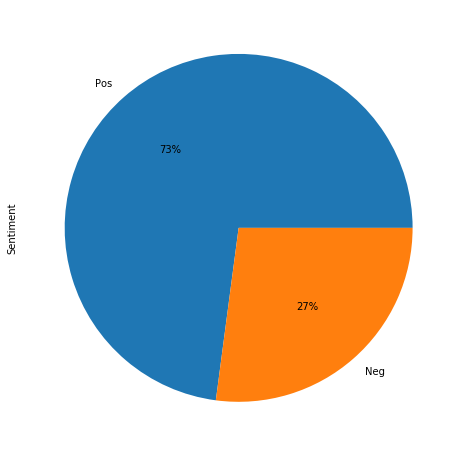

In [212]:
#First data collection - Imbalanced data
data.Sentiment.value_counts().plot(kind='pie', autopct='%1.0f%%')

### Insight on Data collection

Extracted data had imbalance with less value count of Negative review. 
so, Extracted Data again with 6000 records and will select balance data of Positive and negative levels. 

In [213]:
data= pd.DataFrame(data)

In [214]:
Postivie_review= data[data['Sentiment'] == 'Pos'].head(1500)
Negative_review= data[data['Sentiment'] == 'Neg'].head(1500)

In [215]:
Postivie_review.head(3)

,ReviewID,Reviewer Name,Review,Rating,Date_of_Review,Sentiment
0,9bd27314-fc78-41fe-ba69-42669bc763d4,kascam,Amazing cinematography! I don't know how they...,5.0,2019-08-22T23:52:03.870Z,Pos
1,966121979,Stephen M,I loved this movie \n,5.0,2019-08-22T23:50:08.574Z,Pos
2,75D441F3-4AE6-4447-9702-8EDD3BA4153A,William,It was pretty awesome...I was floored by the s...,4.0,2019-08-22T23:32:17.995Z,Pos


In [216]:
Negative_review.head(3)

,ReviewID,Reviewer Name,Review,Rating,Date_of_Review,Sentiment
7,977536013,Dj P,"It was an okay adaptation, but the animated mo...",3.0,2019-08-22T23:10:34.796Z,Neg
8,f5a7061d-78e6-44b1-b8ab-21d4ed9aa28d,Katrina,This movie had two choices: have fun and be en...,2.0,2019-08-22T22:56:04.416Z,Neg
12,65F20DB8-0210-480B-B30B-F9D3234EC3CC,Sandra,The acting and it was pretty bad,2.0,2019-08-22T21:38:50.251Z,Neg


In [217]:
#Combine both the positive and negative reviews data
combine_data=pd.concat([Postivie_review, Negative_review])

In [218]:
#To check if combined data has Sentiment levels properly (Sentiment level 1)
combine_data.head(3)

,ReviewID,Reviewer Name,Review,Rating,Date_of_Review,Sentiment
0,9bd27314-fc78-41fe-ba69-42669bc763d4,kascam,Amazing cinematography! I don't know how they...,5.0,2019-08-22T23:52:03.870Z,Pos
1,966121979,Stephen M,I loved this movie \n,5.0,2019-08-22T23:50:08.574Z,Pos
2,75D441F3-4AE6-4447-9702-8EDD3BA4153A,William,It was pretty awesome...I was floored by the s...,4.0,2019-08-22T23:32:17.995Z,Pos


In [219]:
#To check if combined data has Sentiment levels properly (Sentiment level 0)
combine_data.tail(3)

,ReviewID,Reviewer Name,Review,Rating,Date_of_Review,Sentiment
5551,978175094,Adam D,It had amazing graphics and cinematography. An...,1.5,2019-07-28T06:45:06.273Z,Neg
5552,945088284,NaN,Overall mediocre. You already know the story. ...,2.0,2019-07-28T06:44:25.367Z,Neg
5553,f28cac31-49ac-470f-b003-2b033b71e7e6,Jamie,"Great effects, very slow talking. Much like wa...",3.0,2019-07-28T06:42:45.124Z,Neg


In [220]:
#Renaming to convienient name
data1=combine_data

In [221]:
#To check shape of the data
data1.shape

(3000, 6)

### Balance Data is ready for Data visualization and Processing

### Distribution of few Variables

In [205]:
plot_size = plt.rcParams["figure.figsize"] 
print(plot_size[0]) 
print(plot_size[1])


plot_size[0] = 12
plot_size[1] = 10
plt.rcParams["figure.figsize"] = plot_size 

6.0
4.0


### Sentiment distribution plot

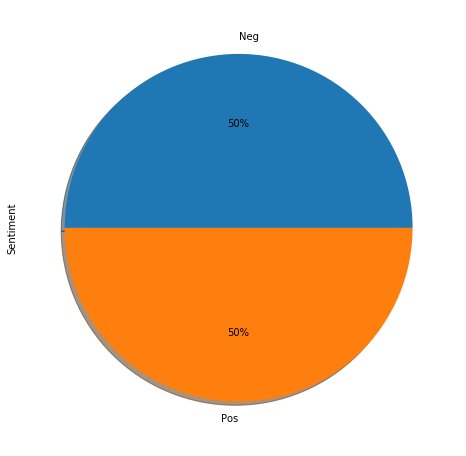

In [222]:
# Sentiment distribution plot

Sentiment = data1.Sentiment.value_counts().plot(kind='pie', autopct='%1.0f%%', shadow=True)


### Rating distribution plot

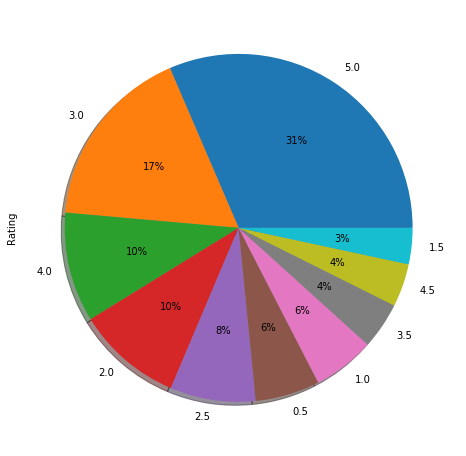

In [223]:
#Rating distribution plot
data1.Rating.value_counts().plot(kind='pie', autopct='%1.0f%%', shadow=True)

In [224]:
#To check the count of Rating in different level/value
data1.Rating.value_counts()

5.0    944
3.0    514
4.0    306
2.0    295
2.5    238
0.5    180
1.0    172
3.5    130
4.5    120
1.5    101
Name: Rating, dtype: int64

### Insights from Value counts and Percentage of Negative:

1. Overall Sentiment of the movie is Positive. 
2. 25% of the Audience gave less than 2 star rating
3. 1/3rd of the Audience gave less than 2.5 star rating. 
4. At the same time, 1/3 rd of Audience gave full rating of 5 stars.

In [225]:
#To check the count of Sentiment in different level/value
data1.Sentiment.value_counts()

Neg    1500
Pos    1500
Name: Sentiment, dtype: int64

In [226]:
#To create a function to view Text data
def print_plot(index):
    example = data[data.index == index][['Review', 'Sentiment']].values[0]
    if len(example) > 0:
        print(example[0])
        print('Sentiment:', example[1])

In [227]:
#Print to view sample Text data
print_plot(100)

Movie was Good , just really wished they had Ed the hyena laughing just like in the original cartoon version lol
Sentiment: Pos


In [229]:
#Converting Date to appropriate data type
data1.Date_of_Review= pd.to_datetime(data1.Date_of_Review)

In [230]:
#To check Date column changed data type
data1.head()

,ReviewID,Reviewer Name,Review,Rating,Date_of_Review,Sentiment
0,9bd27314-fc78-41fe-ba69-42669bc763d4,kascam,Amazing cinematography! I don't know how they...,5.0,2019-08-22 23:52:03.870000+00:00,Pos
1,966121979,Stephen M,I loved this movie \n,5.0,2019-08-22 23:50:08.574000+00:00,Pos
2,75D441F3-4AE6-4447-9702-8EDD3BA4153A,William,It was pretty awesome...I was floored by the s...,4.0,2019-08-22 23:32:17.995000+00:00,Pos
3,c7d41004-8ce5-46f7-ab89-b94d0c634bbe,MrsR,Brought my kids to the original ages ago. This...,5.0,2019-08-22 23:30:52.872000+00:00,Pos
4,2c88353b-108c-436d-bb5f-6ab4f9bb8641,BRENT,I grew up watching this and my kids are now. T...,5.0,2019-08-22 23:22:03.957000+00:00,Pos


## Feature Engineering

Lets us bring in some new features to explain about data clearly

### Weekday Feature creation

In [231]:
#To create new feature - Weekday 
data1['Weekday']=data1['Date_of_Review'].dt.weekday_name

In [232]:
#To view Weekday column
data1.head(3)

,ReviewID,Reviewer Name,Review,Rating,Date_of_Review,Sentiment,Weekday
0,9bd27314-fc78-41fe-ba69-42669bc763d4,kascam,Amazing cinematography! I don't know how they...,5.0,2019-08-22 23:52:03.870000+00:00,Pos,Thursday
1,966121979,Stephen M,I loved this movie \n,5.0,2019-08-22 23:50:08.574000+00:00,Pos,Thursday
2,75D441F3-4AE6-4447-9702-8EDD3BA4153A,William,It was pretty awesome...I was floored by the s...,4.0,2019-08-22 23:32:17.995000+00:00,Pos,Thursday


### Weekend Feature creation

In [233]:
#To create new feature if the review is created on weekday or weekend
data1['dow'] = data1['Date_of_Review'].apply(lambda x: x.date().weekday())
data1['is_weekend'] = data1['Date_of_Review'].apply(lambda x: 1 if x.date().weekday() in (5, 6) else 0)

In [234]:
#To view Weekend column
data1.head(3)

,ReviewID,Reviewer Name,Review,Rating,Date_of_Review,Sentiment,Weekday,dow,is_weekend
0,9bd27314-fc78-41fe-ba69-42669bc763d4,kascam,Amazing cinematography! I don't know how they...,5.0,2019-08-22 23:52:03.870000+00:00,Pos,Thursday,3,0
1,966121979,Stephen M,I loved this movie \n,5.0,2019-08-22 23:50:08.574000+00:00,Pos,Thursday,3,0
2,75D441F3-4AE6-4447-9702-8EDD3BA4153A,William,It was pretty awesome...I was floored by the s...,4.0,2019-08-22 23:32:17.995000+00:00,Pos,Thursday,3,0


In [235]:
#To view count of reivew for each day in Week
data1.Weekday.value_counts()

Tuesday      561
Monday       510
Thursday     481
Wednesday    458
Sunday       427
Saturday     289
Friday       274
Name: Weekday, dtype: int64

### Weekday Distribution

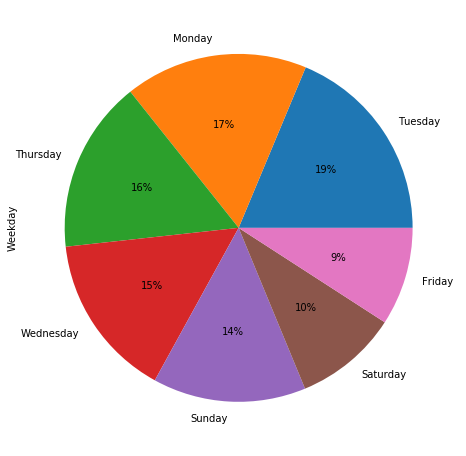

In [236]:
#Weekday distribution plot on Weekdays
data1.Weekday.value_counts().plot(kind='pie', autopct='%1.0f%%')

### Insight on Weekday distribution
1. More people wrote review on Tuesday and Monday.
2. Very less people wrote review on Friday

In [237]:
#To view count of review if it is on weekend or not
data1.is_weekend.value_counts()

0    2284
1     716
Name: is_weekend, dtype: int64

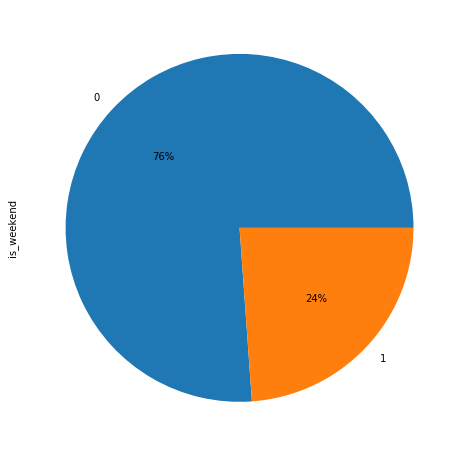

In [238]:
#Plot to view count of review on weekend
data1.is_weekend.value_counts().plot(kind='pie', autopct='%1.0f%%')

### Insight on Weekend distribution
1. Most of the audience wrote review on Weekday. They might have watched movie on weekend, wrote review next day.
2. 24% of people wrote review on Weekend.
Lets see how was the review sentiment on Different days

## Drawing trends toward the Sentiment analysis

In [240]:
#To view count of Positive review on weekend
data1[data1.Sentiment=='Pos'].is_weekend.value_counts(normalize=True)

0    0.795333
1    0.204667
Name: is_weekend, dtype: float64

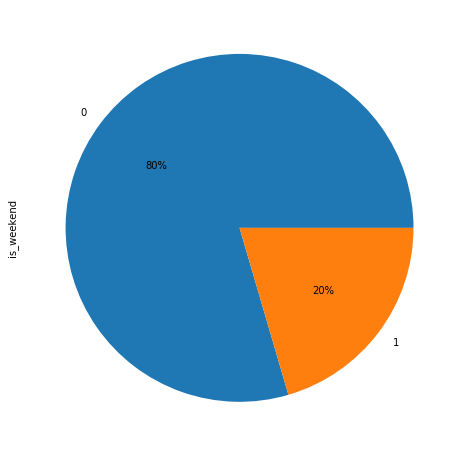

In [241]:
#Plot to view count of Positive review on weekend
data1[data1.Sentiment=='Pos'].is_weekend.value_counts().plot(kind='pie', autopct='%1.0f%%')

### Negative review analysis

In [242]:
#To view count of Negative review on weekend
data1[data1.Sentiment=='Neg'].is_weekend.value_counts(normalize=True)

0    0.727333
1    0.272667
Name: is_weekend, dtype: float64

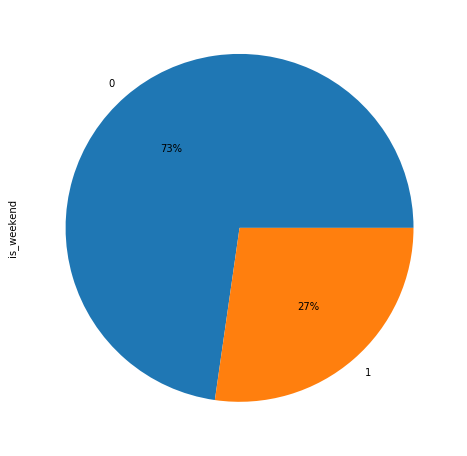

In [243]:
#Plot to view count of Negative review on weekend
data1[data1.Sentiment=='Neg'].is_weekend.value_counts().plot(kind='pie', autopct='%1.0f%%')

In [245]:
#To view count of Positive review on each day of the week
data1[data1.Sentiment=='Neg'].Weekday.value_counts(normalize=True)

Monday       0.220000
Sunday       0.178000
Tuesday      0.156667
Wednesday    0.138000
Thursday     0.124000
Saturday     0.094667
Friday       0.088667
Name: Weekday, dtype: float64

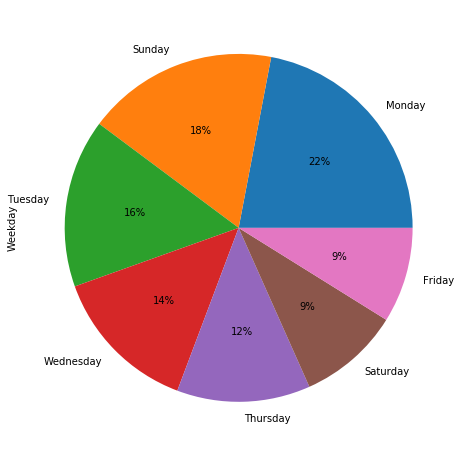

In [246]:
#Plot to view count of Positive review on each day of the week
data1[data1.Sentiment=='Neg'].Weekday.value_counts().plot(kind='pie', autopct='%1.0f%%')

## Insight on Negative reviews

1. Though more Audience wrote review on Tuesday, Negative reviews are higher on Monday. May be because of Monday Blue :(
2. More Negative reviews on Sunday and Monday. 
3. More Negative reviews on Weekend compared to overall weekday
4. Very less negative review on Friday and Saturday. May be because Audience are in Party mood ! :)

# 3. Review Text feature engineering/Text processing

In [22]:
#To view data and understand it. 
data1.head(3)

,ReviewID,Reviewer Name,Review,Rating,Date_of_Review,Sentiment
0,9bd27314-fc78-41fe-ba69-42669bc763d4,kascam,Amazing cinematography! I don't know how they...,5.0,2019-08-22T23:52:03.870Z,Pos
1,966121979,Stephen M,I loved this movie \n,5.0,2019-08-22T23:50:08.574Z,Pos
2,75D441F3-4AE6-4447-9702-8EDD3BA4153A,William,It was pretty awesome...I was floored by the s...,4.0,2019-08-22T23:32:17.995Z,Pos


In [9]:
#Dropping few of the columns which are unneccessary for analysis
data2= data1.drop(['Reviewer Name', 'Rating', 'Date_of_Review'], axis=1)

In [10]:
#To check the data after dropping few columns
data2.head(3)

,ReviewID,Review,Sentiment
0,9bd27314-fc78-41fe-ba69-42669bc763d4,Amazing cinematography! I don't know how they...,Pos
1,966121979,I loved this movie \n,Pos
2,75D441F3-4AE6-4447-9702-8EDD3BA4153A,It was pretty awesome...I was floored by the s...,Pos


In [25]:
#To check shape of the data
data2.shape

(3000, 3)

In [11]:
#To take backup of the modified data to use it in future. 
data2.to_csv("data2.csv", sep=',', columns=['ReviewID', 'Review','Sentiment'], header=True, index=False)

In [27]:
#Exporting review text to Text file - just as a backup file
data2['Review'].to_csv("review.txt", sep=',', columns=['Review',], header=True, index=False)

## Text Cleaning

Audience review has mix of special characters, numbers and bad symbols. 

It needs to be cleaned before we can use review text for classification models.

In [2]:
#To read file from backup.
data2 = pd.read_csv("data2.csv")

In [3]:
#Text cleaning code 
REPLACE_BY_SPACE_RE = re.compile('[/(){}\[\]\|@,;]') #Removing special symbols
BAD_SYMBOLS_RE = re.compile('[^0-9a-z #+_]') #Removing bad symabols
STOPWORDS = set(stopwords.words('english')) #Removing stop words

def clean_text(text):
    """
        text: a string
        
        return: modified initial string
    """
    text = text.lower() # lowercase text
    text = REPLACE_BY_SPACE_RE.sub(' ', text) # replace REPLACE_BY_SPACE_RE symbols by space in text. substitute the matched string in REPLACE_BY_SPACE_RE with space.
    text = BAD_SYMBOLS_RE.sub('', text) # remove symbols which are in BAD_SYMBOLS_RE from text. substitute the matched string in BAD_SYMBOLS_RE with nothing. 
#   text = re.sub(r'\W+', '', text)
    text = ' '.join(word for word in text.split() if word not in STOPWORDS) # remove stopwors from text
    return text
data2['Review'] = data2['Review'].apply(clean_text)

In [29]:
#To take back up of clean review text - just to view
data2['Review'].to_csv("cleanreview.txt", sep=',', columns=['Review',], header=True, index=False)

# 4. Building Base model - LSTM to understand Model Performance

In [94]:
# The maximum number of words to be used. (most frequent)
MAX_NB_WORDS = 2000
# Max number of words in each complaint.
MAX_SEQUENCE_LENGTH = 500
# This is fixed.
EMBEDDING_DIM = 100

tokenizer = Tokenizer(num_words=MAX_NB_WORDS, filters='!"#$%&()*+,-./:;<=>?@[\]^_`{|}~', lower=True)
tokenizer.fit_on_texts(data2['Review'])
word_index = tokenizer.word_index

print('Found %s unique tokens.' % len(word_index))

Found 5585 unique tokens.


In [96]:
#Tokenizing text data and Padding sequence
X = tokenizer.texts_to_sequences(data2['Review'])
X = pad_sequences(X, maxlen=MAX_SEQUENCE_LENGTH)
print('Shape of data tensor:', X.shape)

Shape of data tensor: (3000, 500)


In [98]:
Y = pd.get_dummies(data2['Sentiment'])
print('Shape of label tensor:', Y.shape)

Shape of label tensor: (3000, 2)


### Train Test split for Model

In [99]:
#Train-Test split
X_train, X_test, Y_train, Y_test = train_test_split(X,Y, test_size = 0.20, random_state = 432)
print(X_train.shape,Y_train.shape)
print(X_test.shape,Y_test.shape)

(2400, 500) (2400, 2)
(600, 500) (600, 2)


### LSTM model building with 40% dropout,

In [37]:
#Building Model
model = Sequential()
model.add(Embedding(MAX_NB_WORDS, EMBEDDING_DIM, input_length=X.shape[1]))
model.add(LSTM(100, dropout=0.4, recurrent_dropout=0.4))
model.add(Dense(2, activation='softmax'))
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])
print(model.summary())

W0824 10:10:47.523093  4392 deprecation_wrapper.py:119] From C:\Users\Lokesh\Anaconda3\lib\site-packages\keras\optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.

W0824 10:10:47.582097  4392 deprecation_wrapper.py:119] From C:\Users\Lokesh\Anaconda3\lib\site-packages\keras\backend\tensorflow_backend.py:3376: The name tf.log is deprecated. Please use tf.math.log instead.

W0824 10:10:47.599098  4392 deprecation.py:323] From C:\Users\Lokesh\Anaconda3\lib\site-packages\tensorflow\python\ops\nn_impl.py:180: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_3 (Embedding)      (None, 500, 100)          15000000  
_________________________________________________________________
lstm_3 (LSTM)                (None, 100)               80400     
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 202       
Total params: 15,080,602
Trainable params: 15,080,602
Non-trainable params: 0
_________________________________________________________________
None


In [38]:
#Fitting model

%time
epochs = 3
batch_size = 64

history = model.fit(X_train, Y_train, epochs=epochs, batch_size=batch_size,validation_split=0.1)

Wall time: 0 ns
Train on 2160 samples, validate on 240 samples
Epoch 1/3
2160/2160 [==============================] - 117s 54ms/step - loss: 0.6580 - acc: 0.6495 - val_loss: 0.5986 - val_acc: 0.6958
Epoch 2/3
2160/2160 [==============================] - 119s 55ms/step - loss: 0.5044 - acc: 0.7648 - val_loss: 0.4816 - val_acc: 0.7750
Epoch 3/3
2160/2160 [==============================] - 125s 58ms/step - loss: 0.3385 - acc: 0.8616 - val_loss: 0.4698 - val_acc: 0.7708


In [39]:
#Model Evaluation 
accr = model.evaluate(X_test,Y_test)
print('Test set\n  Loss: {:0.3f}\n  Accuracy: {:0.3f}'.format(accr[0],accr[1]))

600/600 [==============================] - 7s 11ms/step
Test set
  Loss: 0.473
  Accuracy: 0.793


### LSTM Model gave accuracy of 79.3% in first run

####  Loss plot for LSTM model

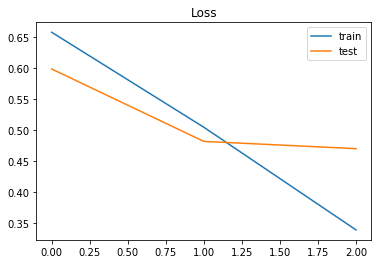

In [53]:
plt.title('Loss')
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show();

####  Accuracy plot for LSTM model

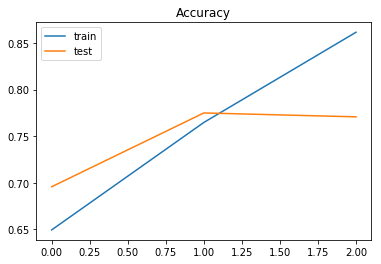

In [54]:
plt.title('Accuracy')
plt.plot(history.history['acc'], label='train')
plt.plot(history.history['val_acc'], label='test')
plt.legend()
plt.show();

### Testing model performance on sample Unseen data

In [57]:
new_Review = ['Awesome movie I love how close it was to the original film absolutely amazing ❤❤❤']
seq = tokenizer.texts_to_sequences(new_Review)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = model.predict(padded)
labels = ['1','0']
print(pred, labels[np.argmax(pred)])


[[0.00907096 0.99092907]] 0


In [58]:
new_Review = ['Its the same move years ago. This time boring. Even my grandsons didnt like it.']
seq = tokenizer.texts_to_sequences(new_Review)
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred = model.predict(padded)
labels = ['1','0']
print(pred, labels[np.argmax(pred)])

[[0.9355758  0.06442422]] 1


LSTM model is predicting correctly to 2 unseen data. 

will predict on unseen test data to check performance

### Loading Unseen Test data

In [108]:
# Loading Unseen Test data
Unseen_test = pd.read_csv("test-1566619745327.csv")

In [109]:
Unseen_test.head(3)

,ReviewID,review
0,92876,Was good. Nothing like the original but I beli...
1,92877,I absolutely loved it! A wonderful rendition o...
2,92878,I love the movie! Good job director! \nI appre...


In [116]:
REPLACE_BY_SPACE_RE = re.compile('[/(){}\[\]\|@,;]') #Removing special symbols
BAD_SYMBOLS_RE = re.compile('[^0-9a-z #+_]') #Removing bad symabols
STOPWORDS = set(stopwords.words('english')) #Removing stop words

def clean_text(text):
    """
        text: a string
        
        return: modified initial string
    """
    text = text.lower() # lowercase text
    text = REPLACE_BY_SPACE_RE.sub(' ', text) # replace REPLACE_BY_SPACE_RE symbols by space in text. substitute the matched string in REPLACE_BY_SPACE_RE with space.
    text = BAD_SYMBOLS_RE.sub('', text) # remove symbols which are in BAD_SYMBOLS_RE from text. substitute the matched string in BAD_SYMBOLS_RE with nothing. 
#   text = re.sub(r'\W+', '', text)
    text = ' '.join(word for word in text.split() if word not in STOPWORDS) # remove stopwors from text
    return text
Unseen_test['review'] = Unseen_test['review'].apply(clean_text)

In [250]:
#Tokenizing text data and Padding sequence
X = tokenizer.texts_to_sequences(Unseen_test['review'])
X = pad_sequences(X, maxlen=MAX_SEQUENCE_LENGTH)
print('Shape of data tensor:', X.shape)

Shape of data tensor: (1200, 500)


In [64]:
seq = tokenizer.texts_to_sequences(Unseen_test['review'])
padded = pad_sequences(seq, maxlen=MAX_SEQUENCE_LENGTH)
pred_unseen = model.predict(padded)
labels = ['0','1']
lstm_output = labels[np.argmax(pred_unseen)]

In [65]:
print(pred_unseen)

[[0.8021249  0.19787511]
 [0.4142864  0.58571357]
 [0.18250997 0.81749004]
 ...
 [0.4568032  0.5431968 ]
 [0.3344999  0.66550016]
 [0.97317684 0.02682317]]


In [73]:
pred_unseen[0]

array([0.8021249 , 0.19787511], dtype=float32)

In [75]:
pred_unseen[1199]

array([0.97317684, 0.02682317], dtype=float32)

In [82]:
lstm_output = []

In [87]:
#Getting max of Levels
labels = ['0','1']
i=0
for i in range(0,1199):
    lstm_output.append(labels[np.argmax(pred_unseen[i])])

In [92]:
lstm_OUT = pd.DataFrame(lstm_output)

In [93]:
#Exporting LSTM model output to CSV file. 
lstm_OUT.to_csv("lstm_output.csv")

### LSTM model output gave 0.34 Metric score at first trial run [on only with basic cleaned text]
Overfitted Model

# 5. Review Text Understanding

Lets understand some insights from Text/Audience review

In [94]:
#To create word count feature with taking length of text split words
data2['word_count'] = [len(text.split(' ')) for text in data2['Review']]

In [95]:
data2.head(3)

,ReviewID,Review,Sentiment,word_count
0,9bd27314-fc78-41fe-ba69-42669bc763d4,amazing cinematography dont know wonderful,Pos,5
1,966121979,loved movie,Pos,2
2,75D441F3-4AE6-4447-9702-8EDD3BA4153A,pretty awesomei floored story cgi,Pos,5


In [96]:
## Getting the first quartile value
q1 = np.percentile(data2.word_count,25)
print(f"The first quartile value of words_count attribute is {q1}")

The first quartile value of words_count attribute is 5.0


In [130]:
## Getting the second quartile value
q2 = np.percentile(data2.word_count,50)
print(f"The first quartile value of words_count attribute is {q2}")

The first quartile value of words_count attribute is 9.0


In [131]:
## Getting the Third quartile value
q3 = np.percentile(data2.word_count,75)
print(f"The first quartile value of words_count attribute is {q3}")

The first quartile value of words_count attribute is 17.0


In [132]:
## Getting the 90% value
q90 = np.percentile(data2.word_count,90)
print(f"The first quartile value of words_count attribute is {q90}")

The first quartile value of words_count attribute is 34.0


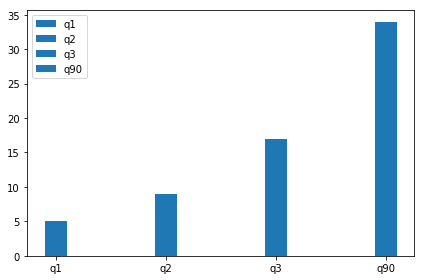

In [70]:
labels = ['q1', 'q2', 'q3', 'q90']
sizes = [5,9,17,34]
patches= plt.bar(x=labels, height=sizes, width=0.2)
plt.legend(patches, labels, loc="best")
plt.tight_layout()
plt.show()

### Insight 

1. 25% of reviews have only 5 words and less. 
2. 50% of the reviews have 9 words and less. 
3. 75% of the reviews have 17 words and less. 
4. only 15% of reviews are more than 30 words

# 6. Review Text feature engineering/Text processing - Continued

### Loading Spacy library

In [4]:
# Loading Spacy library
import spacy
nlp = spacy.load("en_core_web_sm")

In [5]:
## load spacy's English stopwords as variable called 'stopwords'

stopwords = spacy.lang.en.stop_words.STOP_WORDS
print('Number of stop words: %d' % len(stopwords))
print('First ten stop words: %s' % list(stopwords)[:10])

Number of stop words: 326
First ten stop words: ['’ll', 'ever', 'becoming', 'beside', 'in', 'whither', 'me', 'used', 'whence', 'toward']


In [6]:
## load nltk's SnowballStemmer as variable 'stemmer'
from nltk.stem.snowball import SnowballStemmer
stemmer = SnowballStemmer("english")

In [7]:
# Here I define a tokenizer and stemmer which returns the set of stems (excluding stop words) in the text that it is passed

def tokenize_and_stem(doc, remove_stopwords = True):
    # first tokenize by sentence, then by word to ensure that punctuation is caught as it's own token
    if remove_stopwords:
        tokens = [word.text for word in doc if not word.is_stop]
    else:
        tokens = [word.text for word in doc]
        
    #print(tokens[:5])
    filtered_tokens = []
    # filter out any tokens not containing letters (e.g., numeric tokens, raw punctuation)
    for token in tokens:
        if re.search('[a-zA-Z]', token):
            filtered_tokens.append(token)
    
    #print("ended re.search")
    stems = [stemmer.stem(t) for t in filtered_tokens]
    #print("returning stems")
    return stems

def tokenize_and_lemmatize(doc, remove_stopwords = True):
    
    # spaCy will convert word to lower case and changing past tense, 
    # gerund form (other tenses as well) to present tense. Also, “they” normalize to “-PRON-” which is pronoun.

    if remove_stopwords:
        tokens = [word for word in doc if not word.is_stop]
    else:
        tokens = [word for word in doc]
    #print("Completed tokenization")
    filtered_tokens = []
    # filter out any tokens not containing letters (e.g., numeric tokens, raw punctuation)
    for token in tokens:
        if re.search('[a-zA-Z]', token.text):
            filtered_tokens.append(token)
            
    #print("ended re.search")
    lemma = [t.lemma_ for t in filtered_tokens]
    #print("returning stems")
    return lemma


def tokenize_only(doc, remove_stopwords = True):
    # first tokenize by sentence, then by word to ensure that punctuation is caught as it's own token
    if remove_stopwords:
        tokens = [word.text for word in doc if not word.is_stop]
    else:
        tokens = [word.text for word in doc]
    filtered_tokens = []
    # filter out any tokens not containing letters (e.g., numeric tokens, raw punctuation)
    for token in tokens:
        if re.search('[a-zA-Z]', token):
            filtered_tokens.append(token)
    return filtered_tokens

In [8]:
#Converting to dictory 
data2 = data2.reset_index().to_dict(orient='list')

In [64]:
## We are trying to create four seperate lists for text with stop words, text without stop words,
## text with stemmed words and text with lemmatized words.

## Naming Conventions followed ####

## 'clean' word is appended to lists which do not contain stopwords

## 'all' keyword is appended to lists which contain stopwords.

## use extend so it's a big flat list of vocab

data2['clean_text_stemmed'] = []
data2['clean_text_lemmatized'] = []
data2['text_stemmed'] = []
data2['text_lemmatized'] = []

vocab_stemmed = []

vocab_tokenized = []
allvocab_tokenized = []

vocab_lemmatized = []
allvocab_lemmatized = []


for idx,text in enumerate(data2['Review']):

## first convert the entire text into spacy document type
#     print(f"The type of text is {type(text)} and text is {text}")
#     print(f"The type of idx is {type(idx)} and idx is {idx}")
    doc = nlp(text)
    #print(f"processing {idx} document")
    words_stemmed = tokenize_and_stem(doc)
    words_lemmatized = tokenize_and_lemmatize(doc)
    vocab_stemmed.extend(words_stemmed)
    vocab_lemmatized.extend(words_lemmatized)
    
    data2['clean_text_stemmed'].append(words_stemmed)
    data2['clean_text_lemmatized'].append(words_lemmatized)
    
    allwords_stemmed = tokenize_and_stem(doc, False) 
    allwords_lemmatized = tokenize_and_lemmatize(doc, False)
    allvocab_lemmatized.extend(allwords_lemmatized)
    
    data2['text_stemmed'].append(allwords_stemmed)
    data2['text_lemmatized'].append(allwords_lemmatized)
    
    allwords_tokenized = tokenize_only(doc,False)
    allvocab_tokenized.extend(allwords_tokenized)
    
    words_tokenized = tokenize_only(doc)
    vocab_tokenized.extend(words_tokenized)

In [10]:
#Creating Vocab frame list of words

all_vocab_frame = pd.DataFrame({'words': allvocab_tokenized}, index = allvocab_lemmatized)
print ('there are ' + str(all_vocab_frame.shape[0]) + ' items in all_vocab_frame')

vocab_frame = pd.DataFrame({'words': vocab_tokenized}, index = vocab_lemmatized)
print ('there are ' + str(vocab_frame.shape[0]) + ' items in vocab_frame')

there are 49000 items in all_vocab_frame
there are 41879 items in vocab_frame


In [292]:
print (vocab_frame.head(20))

                         words
amazing                Amazing
cinematography  cinematography
know                      know
wonderful            wonderful
love                     loved
movie                    movie
pretty                  pretty
awesome                awesome
floor                  floored
story                    story
cgi                        CGI
bring                  Brought
kid                       kids
original              original
age                       ages
ago                        ago
time                      time
bring                  brought
grandchild       grandchildren
nostalgic            nostalgic


In [293]:
#To take unique vocab words
values, counts = np.unique(vocab_frame, return_counts=True)
all_values, all_counts = np.unique(all_vocab_frame, return_counts=True)

In [294]:
#To sort the vocab words
sorted_indices = np.argsort(-counts)
print(sorted_indices)
all_sorted_indices = np.argsort(-all_counts)
print(all_sorted_indices)

[3818 3995 3547 ... 2381 2357 5801]
[5747 6147 1651 ... 2672 2647 6311]


In [295]:
# To view the vocab words with counts
values = values[sorted_indices]
counts = counts[sorted_indices]

all_values = all_values[all_sorted_indices]
all_counts = all_counts[all_sorted_indices]

## Frequently (Most commonly) used words in Audience Reviews

<BarContainer object of 75 artists>

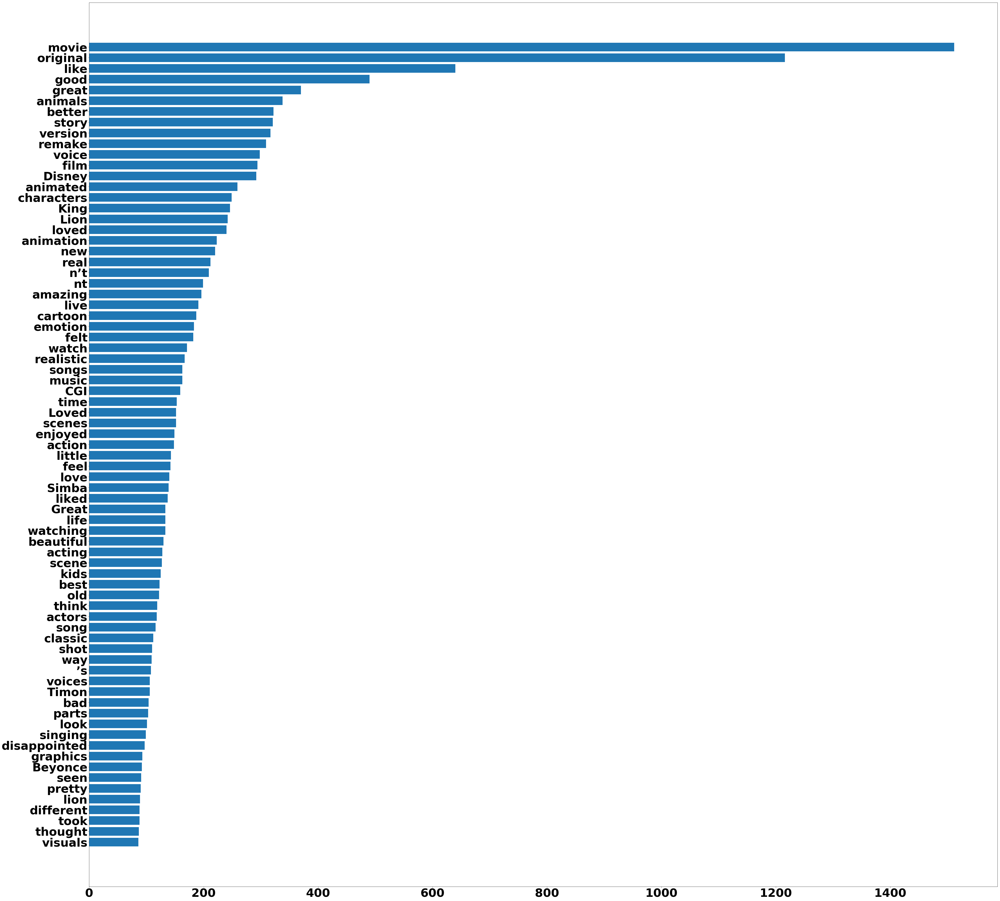

In [305]:
#Plot to print Frequencey words

font = {'weight' : 'bold',
        'size'   : 50}

plt.rc('font', **font)
fig = plt.figure(figsize=(70,70))
plt.barh(values[:75], counts[:75])
plt.gca().invert_yaxis()
plt.show()

In [266]:
#Import Stop words library
from spacy.lang.en.stop_words import STOP_WORDS

In [285]:
# Add word Movie to stop words - default list
stopwords1 = ['movie'] + list(STOP_WORDS)
print(stopwords1[:10],"\n\n")

['movie', "'re", 'last', 'are', 'full', 'upon', 'twelve', 'third', 'thence', '’m'] 




### Plotting frequency plot after adding 'Movie' word to stop words. 

<BarContainer object of 50 artists>

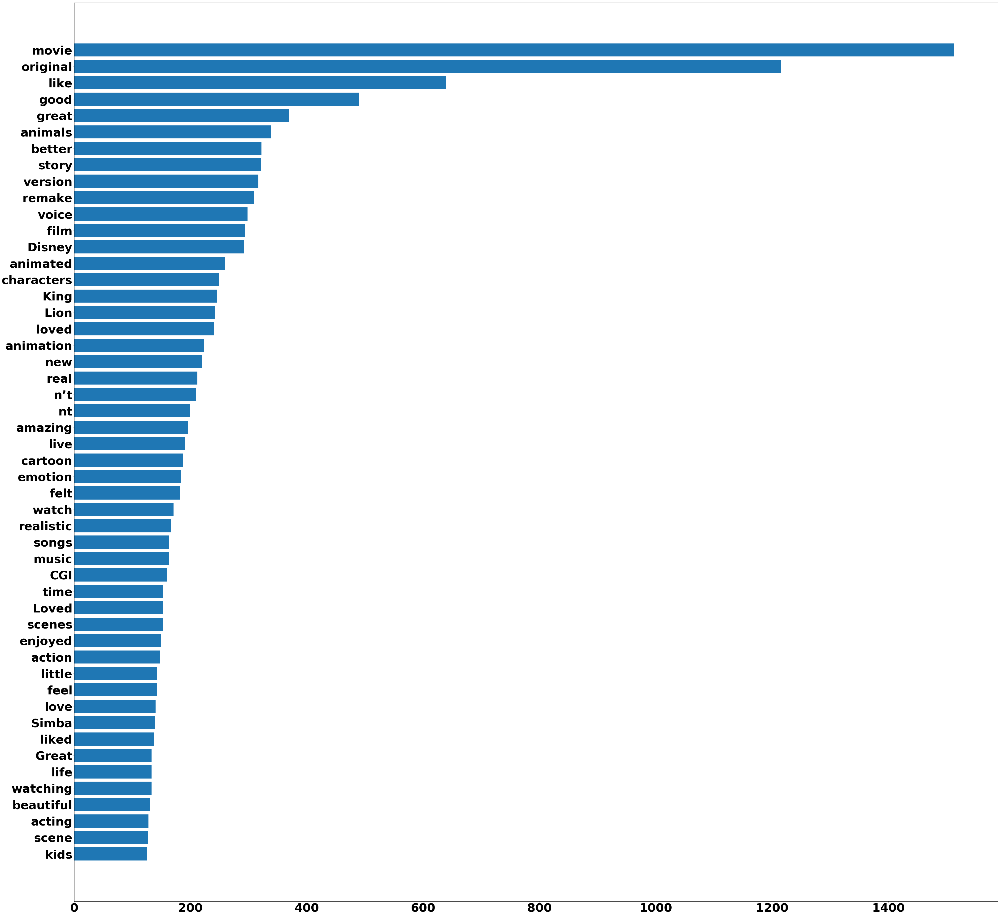

In [296]:
#Plot to print Frequencey words

font = {'weight' : 'bold',
        'size'   : 50}

plt.rc('font', **font)
fig = plt.figure(figsize=(70,70))
plt.barh(values[:50], counts[:50])
plt.gca().invert_yaxis()
plt.line(x=200)
plt.show()

### Insight from Frequncy word count(Most commonly used words)

1. 40% of Audience compared movie with Original movie. ie. Part 1
2. TOP words gives positive sentiment. Top words are Like, Good, Great, better.
3. Animation, CGI, Voice, Cartoon, Song, Music were commented on technical aspect. 
4. Emotions, feel, love, life, realistic, Pride were commented on emotional aspect. 
5. Little King, Lion King, Simba were commented on characters. 

### Word Cloud Plot

In [297]:
from wordcloud import WordCloud

(-0.5, 399.5, 199.5, -0.5)

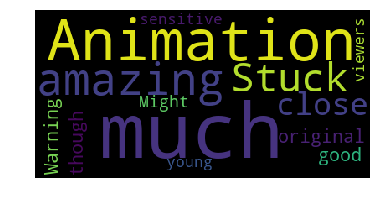

In [303]:
#Plot to get wordcloud
wordcloud = WordCloud().generate(data2['Review'][500])
import matplotlib.pyplot as plt
%matplotlib inline
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

### Insight from wordcloud 

Animation and amazing are visible from word cloud. 

### Business suggestion on Merchandising words 

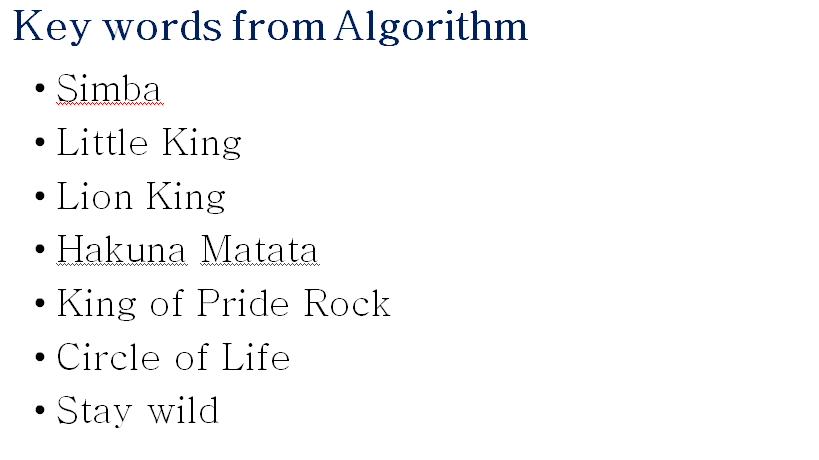

In [307]:
from IPython.display import display, Image
Image("D:\Data_science\PHD\keywords.png")

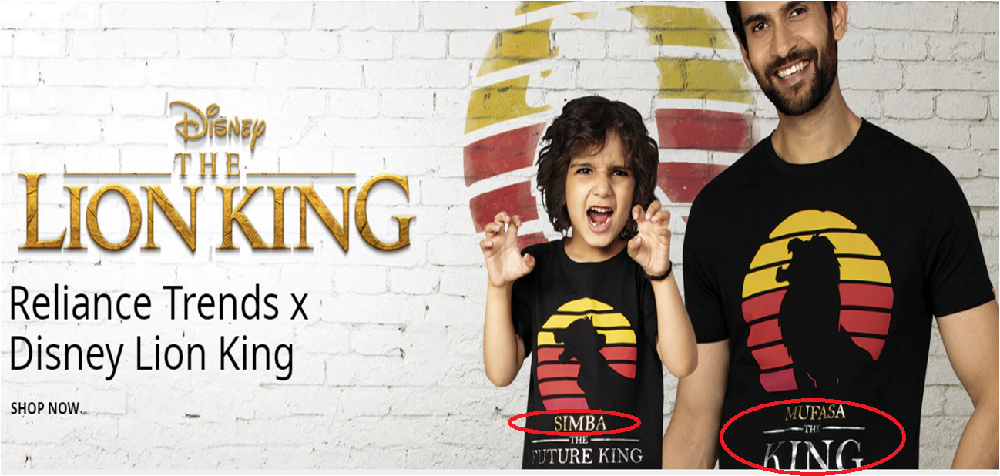

In [308]:
from IPython.display import display, Image
Image("D:\Data_science\PHD\simbatshirt.png")


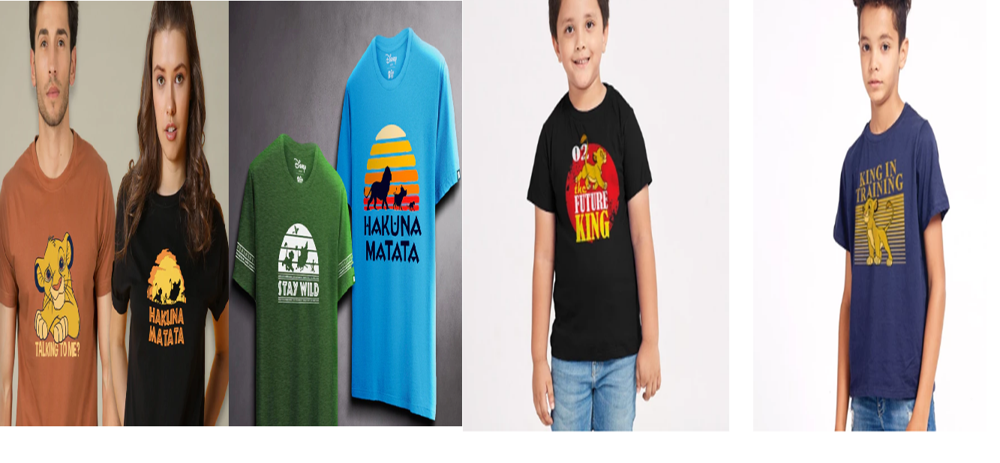

In [62]:
from IPython.display import display, Image
Image("D:\Data_science\PHD\hakunamatata.png")

## 6. Vectorizing words into Matrix form

We have two ways to vectorize the words into matrix form

1. TFIDF vectorizer
2. Count vectorizer. 

Exploring TFIDF vectorizer further with 2 more options with text data, 

1. Non stop word removal text
2. Lemmatized cleantext

## 6A. TFIDF vectorizer 

In [11]:
## tfidf vectorizer needs sentence and not token. Hence we need to combine all the tokens back to form a string

data2['clean_text_stemmed'] = [' '.join(text) for text in data2['clean_text_stemmed']]
data2['clean_text_lemmatized'] = [' '.join(text) for text in data2['clean_text_lemmatized']]
data2['text_lemmatized'] = [' '.join(text) for text in data2['text_lemmatized']]

In [12]:
#To create new variables for Lemmatized clean text and Lemmatized non stop word removal text
cleantext_lemma = data2['clean_text_lemmatized']
text_lemma_nsw = data2['text_lemmatized']

### For cleantext Lemmatized 

In [13]:
from sklearn.feature_extraction.text import TfidfVectorizer

#define vectorizer parameters for cleantext_lemma
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, max_features=7000,
                                 min_df=0.001,
                                 use_idf=True, ngram_range=(1,3))

tfidf_matrix_clntxt = tfidf_vectorizer.fit_transform(cleantext_lemma)

print(tfidf_matrix_clntxt.shape)

(3000, 3525)


In [14]:
#Converting sparse data to dense form
TV_Mat_clntxt = tfidf_matrix_clntxt.todense()
TV_Mat_clntxt

matrix([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]])

In [15]:
#For TFid vector - converting to dataframe
TV_Mat_clntxt = pd.DataFrame(TV_Mat_clntxt)
TV_Mat_clntxt.head()

,0,1,2,3,4,5,6,7,8,9,...,3515,3516,3517,3518,3519,3520,3521,3522,3523,3524
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [16]:
#Define the Target Variable
TV_Mat_clntxt['Sentiment'] = ['0']*1500+['1']*1500


### For Non stop word removal text

In [17]:
#define vectorizer parameters for text_lemma_nsw

#define vectorizer parameters for cleantext_lemma
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, max_features=7000,
                                 min_df=0.001,
                                 use_idf=True, ngram_range=(1,3))

tfidf_matrix_nsw = tfidf_vectorizer.fit_transform(text_lemma_nsw)

print(tfidf_matrix_nsw.shape)

(3000, 4248)


In [18]:
#Converting sparse data to dense form
TV_Mat_nsw = tfidf_matrix_nsw.todense()
TV_Mat_nsw

matrix([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]])

In [19]:
#For TFid vector - with non stop word removal text
TV_Mat_nsw = pd.DataFrame(TV_Mat_nsw)
TV_Mat_nsw.head()

,0,1,2,3,4,5,6,7,8,9,...,4238,4239,4240,4241,4242,4243,4244,4245,4246,4247
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [20]:
#Define the Target Variable
TV_Mat_nsw['Sentiment'] = ['0']*1500+['1']*1500

## 6B. Counter Vectorizer

### Loading libraries for countVectorizer

In [21]:
from nltk.classify.scikitlearn import SklearnClassifier
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix

In [22]:
#define count vectorizer parameters for cleantext_lemma
cv=CountVectorizer(stop_words='english',lowercase=True,
                   strip_accents='unicode',decode_error='ignore')

tdm = cv.fit_transform(data2['clean_text_lemmatized'])
tdm

<3000x4414 sparse matrix of type '<class 'numpy.int64'>'
	with 35430 stored elements in Compressed Sparse Row format>

In [23]:
#Converting sparse data to dense form
Matrix = tdm.todense()
Matrix

matrix([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [24]:
#For Counter vectorizer
Mat = pd.DataFrame(Matrix)
Mat.head()

,0,1,2,3,4,5,6,7,8,9,...,4404,4405,4406,4407,4408,4409,4410,4411,4412,4413
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [25]:
#Define the Target Variable
Mat['Sentiment'] = ['0']*1500+['1']*1500
Mat.head()

,0,1,2,3,4,5,6,7,8,9,...,4405,4406,4407,4408,4409,4410,4411,4412,4413,Sentiment
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# 7. Building KMeans Algorithm - Clustering

In [30]:
#Loading required Libraries for Clustering
import numpy as np
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist
import joblib
Sum_of_squared_distances = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k, random_state=143)
    kmeanModel.fit(tfidf_matrix_nsw)
    Sum_of_squared_distances.append(kmeanModel.inertia_)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=1, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=143, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=2, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=143, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=143, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=4, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=143, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=143, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=6, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=143, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=7, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=143, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=8, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=143, tol=0.0001, verbose=0)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=9, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=143, tol=0.0001, verbose=0)

Text(0.5, 0, 'k')

Text(0, 0.5, 'Sum_of_squared_distances')

Text(0.5, 1.0, 'Elbow Method For Optimal k')

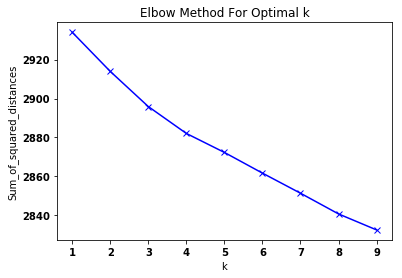

In [31]:
## Plot the elbow

font = {'weight' : 'bold',
        'size'   : 10}

plt.rc('font', **font)
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()


We shall ideally build clustering with K=4. 

with interest to get insight on binary class clustering, we will build cluster with K=2

## 7A. Building Binary class Cluster

In [32]:
#Building Binary class cluster to represent Positive and Negative Sentiment.
num_clusters = 2

km = KMeans(n_clusters=num_clusters)

km.fit(tfidf_matrix_nsw)
#km.labels_
clusters = km.labels_.tolist()
#km.cluster_centers
centers = km.cluster_centers_
print(f"the cluster centers are {centers}")

joblib.dump(km,  'doc_cluster_best_K.pkl')

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=2, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=None, tol=0.0001, verbose=0)

the cluster centers are [[1.22424809e-03 2.85413750e-03 1.19173202e-04 ... 2.67839644e-04
  6.65947080e-05 1.83536280e-04]
 [1.13665009e-03 5.57407398e-03 6.89933721e-04 ... 3.10080292e-03
  1.54331796e-03 1.36289481e-04]]


['doc_cluster_best_K.pkl']

In [33]:
#To view cluster center/Mean values
print(km.cluster_centers_)
print(km.cluster_centers_.shape)

[[1.22424809e-03 2.85413750e-03 1.19173202e-04 ... 2.67839644e-04
  6.65947080e-05 1.83536280e-04]
 [1.13665009e-03 5.57407398e-03 6.89933721e-04 ... 3.10080292e-03
  1.54331796e-03 1.36289481e-04]]
(2, 4248)


In [34]:
#To sort cluster center in order. 
km.cluster_centers_.argsort()

array([[2671, 1812, 3138, ..., 2823, 2128, 2332],
       [3713, 2551, 2552, ...,  903,  895, 2617]], dtype=int64)

In [35]:
## Reversing the list so that index of max element is in 0th index
km.cluster_centers_.argsort()[:,::-1]

array([[2332, 2128, 2823, ..., 3138, 1812, 2671],
       [2617,  895,  903, ..., 2552, 2551, 3713]], dtype=int64)

In [36]:
#To create cluster group feature in our data 
data2['cluster_group'] = clusters
data2.pop('clean_text', None)
pd.DataFrame(data2).head(5)

,index,ReviewID,Review,Sentiment,clean_text_stemmed,clean_text_lemmatized,text_stemmed,text_lemmatized,cluster_group
0,0,9bd27314-fc78-41fe-ba69-42669bc763d4,amazing cinematography dont know wonderful,Pos,amaz cinematographi nt know wonder,amazing cinematography not know wonderful,"[amaz, cinematographi, do, nt, know, wonder]",amazing cinematography do not know wonderful,1
1,1,966121979,loved movie,Pos,love movi,love movie,"[love, movi]",love movie,0
2,2,75D441F3-4AE6-4447-9702-8EDD3BA4153A,pretty awesomei floored story cgi,Pos,pretti awesomei floor stori cgi,pretty awesomei floored story cgi,"[pretti, awesomei, floor, stori, cgi]",pretty awesomei floored story cgi,0
3,3,c7d41004-8ce5-46f7-ab89-b94d0c634bbe,brought kids original ages ago time brought 3 ...,Pos,brought kid origin age ago time brought grandc...,bring kid original age ago time bring grandchi...,"[brought, kid, origin, age, ago, time, brought...",bring kid original age ago time bring grandchi...,0
4,4,2c88353b-108c-436d-bb5f-6ab4f9bb8641,grew watching kids version really brings life ...,Pos,grew watch kid version bring life awesom,grow watch kid version bring life awesome,"[grew, watch, kid, version, realli, bring, lif...",grow watch kid version really bring life awesome,0


In [37]:
#To create new Dataframe to proceed with few more steps
cluster_df = pd.DataFrame(data2)

In [38]:
#To view count of levels in each cluster
cluster_df['cluster_group'].value_counts()

0    2384
1     616
Name: cluster_group, dtype: int64

In [39]:
##Step 1
cluster_df['tokenized_text'] = [text.split(' ') for text in cluster_df['text_lemmatized']]

In [40]:
##Step 2
grouped_text = cluster_df.groupby('cluster_group')['tokenized_text']

In [41]:
## Fetch entire tokenized text for specific group
grouped_text.get_group(0)

1                                           [love, movie]
2                 [pretty, awesomei, floored, story, cgi]
3       [bring, kid, original, age, ago, time, bring, ...
4       [grow, watch, kid, version, really, bring, lif...
5                   [realistic, look, scary, little, one]
                              ...                        
2993    [try, make, film, realistic, fashion, lose, co...
2994    [absolutely, terrible, like, talk, 15x, speed,...
2995    [less, dynamic, 90, animation, broadway, adapt...
2996    [timon, pumba, good, part, voice, beyonc, awkw...
2999    [great, effect, slow, talk, much, like, watch,...
Name: tokenized_text, Length: 2384, dtype: object

### Frequent word data in cluster wise

In [42]:
from itertools import chain

In [43]:
frequent_words_df = pd.DataFrame(columns={"values", "counts", "cluster_id"})

In [44]:
for num in range(num_clusters):
    values, counts = np.unique(list(chain.from_iterable(grouped_text.get_group(num))), return_counts=True)
    sorted_indices = np.argsort(-counts)
    frequent_words_df = frequent_words_df.append({"values":values[sorted_indices], "counts":counts[sorted_indices], "cluster_id": num}, ignore_index=True)

In [45]:
#To view head of frequenct value dataframe
frequent_words_df.head()

,cluster_id,values,counts
0,0,"[movie, original, love, like, good, great, see...","[1141, 819, 503, 432, 425, 399, 290, 270, 246,..."
1,1,"[not, do, movie, original, like, be, good, voi...","[915, 611, 481, 428, 343, 268, 228, 205, 186, ..."


# Frequncy PLOTS to understand Postive reviews and Negative reviews

<BarContainer object of 30 artists>

<BarContainer object of 30 artists>

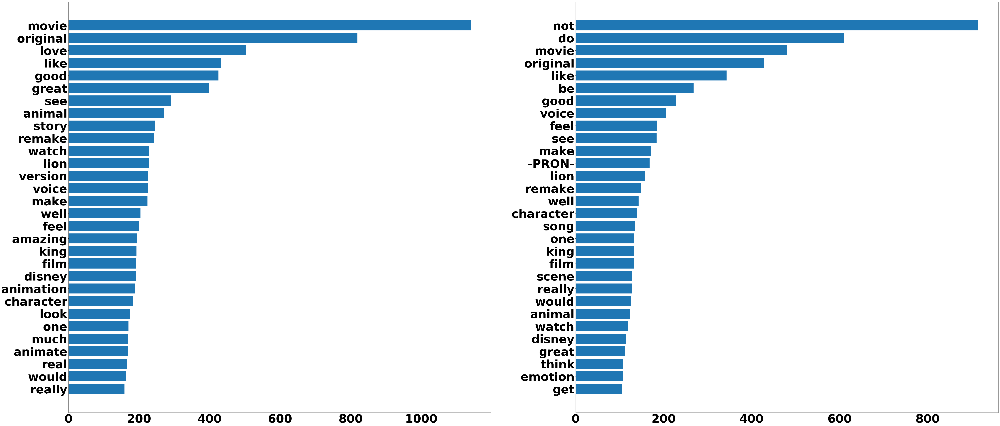

In [53]:
#Plot to get frequency words in different levels. 

font = {'weight' : 'bold',
        'size'   : 70}

plt.rc('font', **font)

fig = plt.figure(figsize=(100,100))
plt.subplot(2,2,1)
plt.barh(frequent_words_df.loc[0,'values'][:30], frequent_words_df.loc[0,'counts'][:30])
plt.gca().invert_yaxis()


plt.subplot(2,2,2)
plt.barh(frequent_words_df.loc[1,'values'][:30], frequent_words_df.loc[1,'counts'][:30])
plt.gca().invert_yaxis()



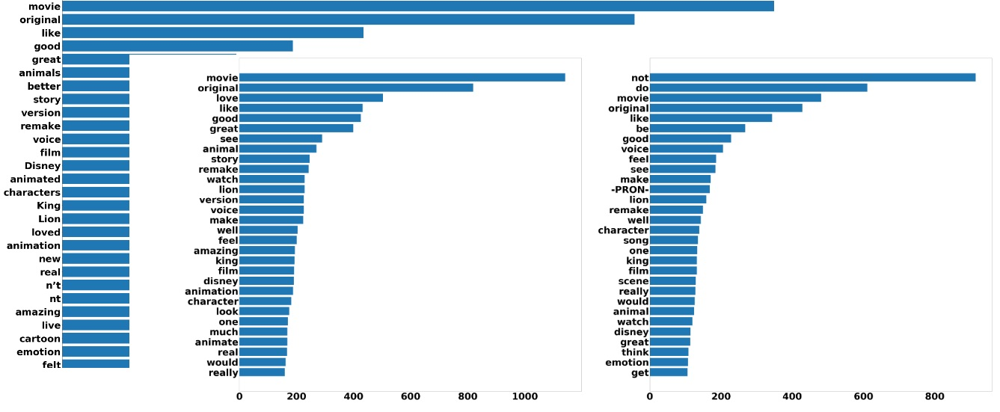

In [68]:
from IPython.display import display, Image
Image("D:\Data_science\PHD\wordcamparision.png")

# Clustering Comparing Report 

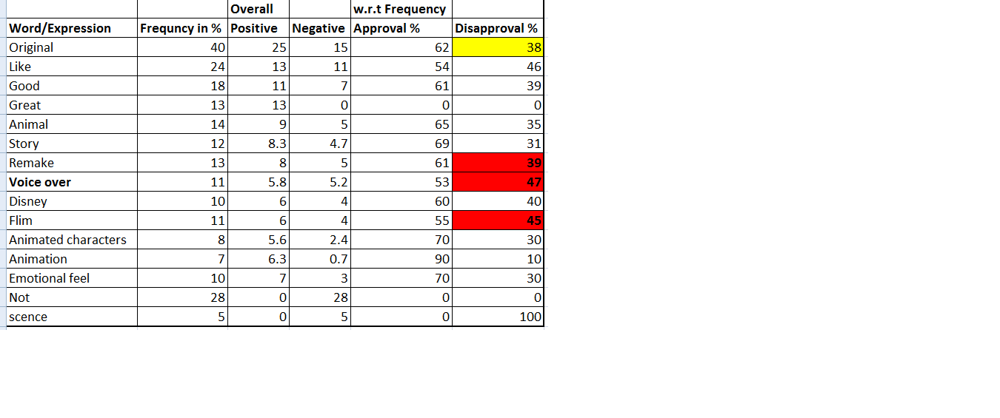

In [71]:
from IPython.display import display, Image
Image("D:\Data_science\PHD\ClusteringComparisionReport.png")

# Business Insight on clustering report

#### 1. Original: 

40% of the Audience compared Lion King 2019 movie with Original movie 1994. 

62% of Audience gave positive sentiment on Movie while 38% of the audience gave negative sentiment

#### 2. Story:
12% of the audience talked about story of the movie. 

69% of audience are happy with story line while 31% of audience are not so happy. 

#### 3. Remake:
13% of audience commented about remake version. 

61% of audience felt excited about remake version while 39% of audience expectation was not met. 

#### 4. Voice Over : 
11% of audience expressed about Voice over in the movie. 

53% of audience felt pleasant. 47% of audience expressed it as disguesting. 

Especially female voice over character should have been better. 

#### 5. Disney - Comment on production house
10% of audience wrote comment on Disney. 

60% approve of the Disney's make while 40% disapprove of it. 

#### 6. Animation 
90% of audience who wrote comment expressed WOW feel for animation. 

However 10% felt it could have been better. 

Overall, Thumbsup for Animation !!

#### 7. Animated Charcters - CGI - Computer Generated Imaginery
8% of audience expressed about CGI - Animated characters. 

70% of audience are exclaimed about how it was made.

30% of audience expected level did not meet. 

#### 8. Emotional IQ

10% of the audience explained about emotional mix in the movie. 

70% of audience felt good as movie portary Pride, Bravery and life cycle etc.

30% of audience felt scary for little kids, rude in few of the scenes. 

#### 9. Not - Strong Negation
28% of audience expressed strong negative sentiments on movie. 

#### 10. Scene

5% of audience felt few of the scenes are scary, brave, emotional. 



# 8. Train Test split to build models

### 8A. Train test split for TFIDF vectors - CleanText Lemma

In [26]:
# Train Test split_TV - Cleantext Lemma
TV_Mat_clntxt = TV_Mat_clntxt.sample(frac = 1,random_state=1234)
train_tv_clntext = TV_Mat_clntxt.iloc[:2400]
test_tv_clntext = TV_Mat_clntxt.iloc[2400:]

In [27]:
#To get train test split for both X and Y

X_train_TV_clntxt=train_tv_clntext.iloc[:,:-1]#from col1 to collast, except last one (Excl target) slicing
Y_train_TV_clntxt=train_tv_clntext.iloc[:,-1]#selecting target col

X_test_TV_clntxt=test_tv_clntext.iloc[:,:-1]#from col1 to collast, except last one (Excl target) slicing
Y_test_TV_clntxt=test_tv_clntext.iloc[:,-1]#selecting target col

### 8B. Train test split for TFIDF vectors - Non stop word removed Text

In [28]:
# Train Test split_TV - Non stop word removal word
TV_Mat_nsw = TV_Mat_nsw.sample(frac = 1,random_state=4321)
train_tv_nsw = TV_Mat_nsw.iloc[:2400]
test_tv_nsw = TV_Mat_nsw.iloc[2400:]

In [29]:
#To get train test split for both X and Y

X_train_TV_nsw=train_tv_nsw.iloc[:,:-1]#from col1 to collast, except last one (Excl target) slicing
Y_train_TV_nsw=train_tv_nsw.iloc[:,-1]#selecting target col

X_test_TV_nsw=test_tv_nsw.iloc[:,:-1]#from col1 to collast, except last one (Excl target) slicing
Y_test_TV_nsw=test_tv_nsw.iloc[:,-1]#selecting target col

### 8c. Train Test split to build models for count vectorizer

In [30]:
# Train Test split_count vectorizer
Mat = Mat.sample(frac = 1,random_state=1234)
train_cv = Mat.iloc[:2400]
test_cv = Mat.iloc[2400:]

In [31]:
#To get train test split for both X and Y
X_train_CV=train_cv.iloc[:,:-1]#from col1 to collast, except last one (Excl target) slicing
Y_train_CV=train_cv.iloc[:,-1]#selecting target col

X_test_CV=test_cv.iloc[:,:-1]#from col1 to collast, except last one (Excl target) slicing
Y_test_CV=test_cv.iloc[:,-1]#selecting target col


## 9. Model Building using Count Vectorized word

## 9A. Logistic Regression Model

In [32]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import f1_score, accuracy_score

logreg = LogisticRegression()
logreg.fit(X_train_CV,Y_train_CV)

C:\Users\Lokesh\AppData\Roaming\Python\Python37\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.



LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [33]:
#Predictions on test data
lr_pred_train=logreg.predict(X_train_CV)
lr_pred=logreg.predict(X_test_CV)

In [34]:
# Test data confusion Matrix
confusion_matrix_lr = confusion_matrix(Y_test_CV,lr_pred)

In [35]:
### Train data accuracy
print("\n\n--------------------------------------\n\n")

print("\nTrain DATA ACCURACY",accuracy_score(Y_train_CV,lr_pred_train))
print("\n Traindata f1-score for class '1'",f1_score(Y_train_CV,lr_pred_train, average='weighted', pos_label='1' ))

### Test data accuracy
print("\n\n--------------------------------------\n\n")

print("TEST Conf Matrix : \n", confusion_matrix_lr)
print("\nTEST DATA ACCURACY",accuracy_score(Y_test_CV,lr_pred))
print("\nTest data f1-score for class '1'",f1_score(Y_test_CV,lr_pred, average='weighted', pos_label='1' ))



--------------------------------------



Train DATA ACCURACY 0.9233333333333333


C:\Users\Lokesh\AppData\Roaming\Python\Python37\site-packages\sklearn\metrics\classification.py:1259: UserWarning:

Note that pos_label (set to '1') is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.




 Traindata f1-score for class '1' 0.9233247063922715


--------------------------------------


TEST Conf Matrix : 
 [[236  55]
 [ 67 242]]

TEST DATA ACCURACY 0.7966666666666666


C:\Users\Lokesh\AppData\Roaming\Python\Python37\site-packages\sklearn\metrics\classification.py:1259: UserWarning:

Note that pos_label (set to '1') is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.




Test data f1-score for class '1' 0.7967073374004068


### Logistic classification model give 79.6% F1 score

### 9B. Naive Bayes Algorithm

In [36]:
from sklearn.naive_bayes import MultinomialNB
NB = MultinomialNB()
NB.fit(X_train_CV,Y_train_CV)

# Predictions on test data
NB_pred=NB.predict(X_train_CV)

# Predictions on test data
NB_pred=NB.predict(X_test_CV)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [39]:
# Test data confusion Matrix
confusion_matrix_NB = confusion_matrix(Y_test_CV,NB_pred)

### Train data accuracy
print("\n\n--------------------------------------\n\n")

print("\nTrain DATA ACCURACY",accuracy_score(Y_train_CV,lr_pred_train))
print("\n Traindata f1-score for class '1'",f1_score(Y_train_CV,lr_pred_train, average='weighted', pos_label='1'))

### Test data accuracy
print("\n\n--------------------------------------\n\n")

print("TEST Conf Matrix : \n", confusion_matrix_NB)
print("\nTEST DATA ACCURACY",accuracy_score(Y_test_CV,NB_pred))
print("\nTest data f1-score for class '1'",f1_score(Y_test_CV,NB_pred, average='weighted' ))



--------------------------------------



Train DATA ACCURACY 0.9233333333333333


C:\Users\Lokesh\AppData\Roaming\Python\Python37\site-packages\sklearn\metrics\classification.py:1259: UserWarning:

Note that pos_label (set to '1') is ignored when average != 'binary' (got 'weighted'). You may use labels=[pos_label] to specify a single positive class.




 Traindata f1-score for class '1' 0.9233247063922715


--------------------------------------


TEST Conf Matrix : 
 [[231  60]
 [ 70 239]]

TEST DATA ACCURACY 0.7833333333333333

Test data f1-score for class '1' 0.7833814900426743


### Naive Bayes model give 78.3% F1 score

### 9C. SVM Model

In [40]:
## Build a SVM Classifier
from sklearn.svm import SVC

## Create an SVC object and print it to see the default arguments
svc = SVC()
svc

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='rbf', max_iter=-1, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)

In [41]:
## Fit
svc_cv = svc.fit(X_train_CV, Y_train_CV)

C:\Users\Lokesh\AppData\Roaming\Python\Python37\site-packages\sklearn\svm\base.py:193: FutureWarning:

The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.



In [44]:
# Predictions on train data
svm_pred_cv_train=svc_cv.predict(X_train_CV)

# Predictions on test data
svm_pred_cv=svc_cv.predict(X_test_CV)
confusion_matrix_test_svm_cv= confusion_matrix(Y_test_CV, svm_pred_cv)

In [46]:
### Train data accuracy
print("\n\n--------------------------------------\n\n")

print("\Train DATA ACCURACY",accuracy_score(Y_train_CV, svm_pred_cv_train))
print("\n Train data f1-score for class '1'",f1_score(Y_train_CV, svm_pred_cv_train, average='weighted'))

### Test data accuracy
print("\n\n--------------------------------------\n\n")

print("TEST Conf Matrix : \n", confusion_matrix_test_svm_cv)
print("\nTEST DATA ACCURACY",accuracy_score(Y_test_CV, svm_pred_cv))
print("\nTest data f1-score for class '1'",f1_score(Y_test_CV, svm_pred_cv, average='weighted'))




--------------------------------------


\Train DATA ACCURACY 0.5266666666666666

 Train data f1-score for class '1' 0.3909319343556632


--------------------------------------


TEST Conf Matrix : 
 [[286   5]
 [292  17]]

TEST DATA ACCURACY 0.505

Test data f1-score for class '1' 0.3721408084439176


SVM model gives worst accuracy. 

### 9D. Decision Tree Model

In [47]:

from sklearn.tree import DecisionTreeClassifier
Dtc = DecisionTreeClassifier()

In [48]:
# Build Model
%time Dtc.fit(X_train_CV, Y_train_CV)

Wall time: 2.04 s


DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [50]:
# Predictions on test data
DTC_pred_CV_train=Dtc.predict(X_train_CV)
DTC_pred_CV=Dtc.predict(X_test_CV)
confusion_matrix_test_dtc_cv= confusion_matrix(Y_test_CV,DTC_pred_CV)

In [51]:
### Train data accuracy
print("\n\n--------------------------------------\n\n")

print("\Train DATA ACCURACY",accuracy_score(Y_train_CV, DTC_pred_CV_train))
print("\n Train data f1-score for class '1'",f1_score(Y_train_CV, DTC_pred_CV_train, average='weighted'))

### Test data accuracy
print("\n\n--------------------------------------\n\n")

print("TEST Conf Matrix : \n", confusion_matrix_test_dtc_cv)
print("\nTEST DATA ACCURACY",accuracy_score(Y_test_CV,DTC_pred_CV))
print("\nTest data f1-score for class '1'",f1_score(Y_test_CV,DTC_pred_CV, average='weighted'))



--------------------------------------


\Train DATA ACCURACY 0.9966666666666667

 Train data f1-score for class '1' 0.9966666157364612


--------------------------------------


TEST Conf Matrix : 
 [[227  64]
 [133 176]]

TEST DATA ACCURACY 0.6716666666666666

Test data f1-score for class '1' 0.6684338512418894


### 9E. Random Forest Model

In [52]:
from sklearn.ensemble import RandomForestClassifier
Rf = RandomForestClassifier()

In [54]:
# Build Model
%time Rf.fit(X_train_CV, Y_train_CV)

C:\Users\Lokesh\AppData\Roaming\Python\Python37\site-packages\sklearn\ensemble\forest.py:245: FutureWarning:

The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.



Wall time: 830 ms


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [55]:
# Predictions on test data
RF_pred_CV_train=Dtc.predict(X_train_CV)
RF_pred_CV=Dtc.predict(X_test_CV)
confusion_matrix_test_rf_cv= confusion_matrix(Y_test_CV,DTC_pred_CV)

In [56]:
### Train data accuracy
print("\n\n--------------------------------------\n\n")

print("\Train DATA ACCURACY",accuracy_score(Y_train_CV, RF_pred_CV_train))
print("\n Train data f1-score for class '1'",f1_score(Y_train_CV, RF_pred_CV_train, average='weighted'))

### Test data accuracy
print("\n\n--------------------------------------\n\n")

print("TEST Conf Matrix : \n", confusion_matrix_test_rf_cv)
print("\Train DATA ACCURACY",accuracy_score(Y_test_CV, RF_pred_CV))
print("\n Train data f1-score for class '1'",f1_score(Y_test_CV, RF_pred_CV, average='weighted'))



--------------------------------------


\Train DATA ACCURACY 0.9966666666666667

 Train data f1-score for class '1' 0.9966666157364612


--------------------------------------


TEST Conf Matrix : 
 [[227  64]
 [133 176]]
\Train DATA ACCURACY 0.6716666666666666

 Train data f1-score for class '1' 0.6684338512418894


### 9F. Gradient Boosting Ensemble Model

In [57]:
from sklearn.ensemble import GradientBoostingClassifier

In [58]:
Gbm = GradientBoostingClassifier()

In [59]:
# Build Model
%time Gbm.fit(X_train_CV, Y_train_CV)

Wall time: 1min 8s


GradientBoostingClassifier(criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='auto',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [61]:
# Predictions on test data
Gbm_pred_CV_train=Gbm.predict(X_train_CV)
Gbm_pred_CV=Gbm.predict(X_test_CV)
confusion_matrix_test_gbm_cv= confusion_matrix(Y_test_CV,Gbm_pred_CV)

In [62]:
### Train data accuracy
print("\n\n--------------------------------------\n\n")

print("\Train DATA ACCURACY",accuracy_score(Y_train_CV, Gbm_pred_CV_train))
print("\n Train data f1-score for class '1'",f1_score(Y_train_CV, Gbm_pred_CV_train, average='weighted'))

### Test data accuracy
print("\n\n--------------------------------------\n\n")

print("TEST Conf Matrix : \n", confusion_matrix_test_gbm_cv)
print("\Train DATA ACCURACY",accuracy_score(Y_test_CV, Gbm_pred_CV))
print("\n Train data f1-score for class '1'",f1_score(Y_test_CV, Gbm_pred_CV, average='weighted'))



--------------------------------------


\Train DATA ACCURACY 0.8320833333333333

 Train data f1-score for class '1' 0.8317696891772752


--------------------------------------


TEST Conf Matrix : 
 [[225  66]
 [ 75 234]]
\Train DATA ACCURACY 0.765

 Train data f1-score for class '1' 0.7650528868995525


# 10. Model Building using TFIDF vectorizer

## 10A. Logistic Regression Model

In [20]:
from sklearn.metrics import confusion_matrix, roc_curve, auc
from sklearn.metrics import accuracy_score,f1_score, confusion_matrix
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import auc
from sklearn.metrics import average_precision_score
from matplotlib import pyplot


In [54]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(C=0.4)
logreg.fit(X_train_TV_nsw,Y_train_TV_nsw)

C:\Users\Lokesh\AppData\Roaming\Python\Python37\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.



LogisticRegression(C=0.4, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [55]:
#Predictions on train data
lr_pred_tv_train_nsw=logreg.predict(X_train_TV_nsw)
#Predictions on test data
lr_pred_tv_test_nsw=logreg.predict(X_test_TV_nsw)

In [56]:
# Train data confusion Matrix
confusion_matrix_lr_tv_train_nsw = confusion_matrix(Y_train_TV_nsw,lr_pred_tv_train_nsw)
# Test data confusion Matrix
confusion_matrix_lr_tv_test_nsw = confusion_matrix(Y_test_TV_nsw,lr_pred_tv_test_nsw)

In [57]:

### Train data accuracy
print("\n\n--------------------------------------\n\n")

print("Train Conf Matrix : \n", confusion_matrix_lr_tv_train_nsw)
print("\nTrain DATA ACCURACY",accuracy_score(Y_train_TV_nsw,lr_pred_tv_train_nsw))
print("\nTrain data f1-score for class '1'",f1_score(Y_train_TV_nsw,lr_pred_tv_train_nsw, average='weighted'))


### Test data accuracy
print("\n\n--------------------------------------\n\n")

print("TEST Conf Matrix : \n", confusion_matrix_lr_tv_test_nsw)
print("\nTEST DATA ACCURACY",accuracy_score(Y_test_TV_nsw,lr_pred_tv_test_nsw))
print("\nTest data f1-score for class '1'",f1_score(Y_test_TV_nsw,lr_pred_tv_test_nsw, average='weighted'))



--------------------------------------


Train Conf Matrix : 
 [[1037  170]
 [  98 1095]]

Train DATA ACCURACY 0.8883333333333333

Train data f1-score for class '1' 0.8882523276904544


--------------------------------------


TEST Conf Matrix : 
 [[209  84]
 [ 37 270]]

TEST DATA ACCURACY 0.7983333333333333

Test data f1-score for class '1' 0.7967105087118055


In [58]:
# predict probabilities
probs = logreg.predict_proba(X_test_TV_nsw)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# predict class values
yhat = logreg.predict(X_test_TV_nsw)
# calculate precision-recall curve
precision, recall, thresholds = precision_recall_curve(Y_test_TV_nsw, probs, pos_label='1')
# calculate F1 score
f1 = f1_score(Y_test_TV_nsw, yhat, average='weighted')



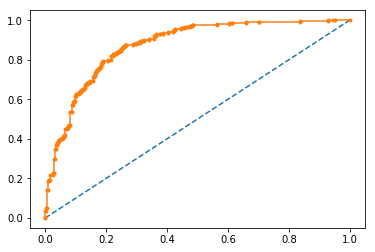

In [59]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
# calculate roc curve
fpr, tpr, thresholds = roc_curve(Y_test_TV_nsw, probs, pos_label='1')
# plot no skill
pyplot.plot([0, 1], [0, 1], linestyle='--')
# plot the precision-recall curve for the model
pyplot.plot(fpr, tpr, marker='.')
# show the plot
pyplot.show()

### Logistic on clean Text

In [21]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(C=0.5)
logreg.fit(X_train_TV_clntxt,Y_train_TV_clntxt)

C:\Users\Lokesh\AppData\Roaming\Python\Python37\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.



LogisticRegression(C=0.5, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [22]:
#Predictions on train data
lr_pred_tv_train_clntxt =logreg.predict(X_train_TV_clntxt)
#Predictions on test data
lr_pred_tv_test_clntxt=logreg.predict(X_test_TV_clntxt)

In [23]:
# Train data confusion Matrix
confusion_matrix_lr_tv_train_clntxt = confusion_matrix(Y_train_TV_clntxt,lr_pred_tv_train_clntxt)
# Test data confusion Matrix
confusion_matrix_lr_tv_test_clntxt = confusion_matrix(Y_test_TV_clntxt,lr_pred_tv_test_clntxt)

In [24]:

### Train data accuracy
print("\n\n--------------------------------------\n\n")

print("Train Conf Matrix : \n", confusion_matrix_lr_tv_train_clntxt)
print("\nTrain DATA ACCURACY",accuracy_score(Y_train_TV_clntxt,lr_pred_tv_train_clntxt))
print("\nTrain data f1-score for class '1'",f1_score(Y_train_TV_clntxt,lr_pred_tv_train_clntxt, average='weighted'))


### Test data accuracy
print("\n\n--------------------------------------\n\n")

print("TEST Conf Matrix : \n", confusion_matrix_lr_tv_test_clntxt)
print("\nTEST DATA ACCURACY",accuracy_score(Y_test_TV_clntxt,lr_pred_tv_test_clntxt))
print("\nTest data f1-score for class '1'",f1_score(Y_test_TV_clntxt,lr_pred_tv_test_clntxt, average='weighted'))



--------------------------------------


Train Conf Matrix : 
 [[1036  173]
 [ 107 1084]]

Train DATA ACCURACY 0.8833333333333333

Train data f1-score for class '1' 0.8832691409897291


--------------------------------------


TEST Conf Matrix : 
 [[223  68]
 [ 39 270]]

TEST DATA ACCURACY 0.8216666666666667

Test data f1-score for class '1' 0.8209873082330188


In [129]:
lr_pred_unseen = logreg.predict(TV_Mat_unseen)

## 10B. Naive Bayes Model

In [25]:
from sklearn.naive_bayes import MultinomialNB
NB = MultinomialNB(alpha=0.4, fit_prior=True)
NB.fit(X_train_TV_clntxt,Y_train_TV_clntxt)

# Predictions on train data
NB_pred_train=NB.predict(X_train_TV_clntxt)
confusion_matrix_NB_train= confusion_matrix(Y_train_TV_clntxt,NB_pred_train)

# Predictions on test data
NB_pred_test=NB.predict(X_test_TV_clntxt)
confusion_matrix_NB_test= confusion_matrix(Y_test_TV_clntxt,NB_pred_test)

MultinomialNB(alpha=0.4, class_prior=None, fit_prior=True)

In [26]:

### Train data accuracy
print("\n\n--------------------------------------\n\n")

print("Train Conf Matrix : \n", confusion_matrix_NB_train)
print("\nTrain DATA ACCURACY",accuracy_score(Y_train_TV_clntxt,NB_pred_train))
print("\nTrain data f1-score for class '1'",f1_score(Y_train_TV_clntxt,NB_pred_train, average='weighted'))


### Test data accuracy
print("\n\n--------------------------------------\n\n")

print("TEST Conf Matrix : \n", confusion_matrix_NB_test)
print("\nTEST DATA ACCURACY",accuracy_score(Y_test_TV_clntxt,NB_pred_test))
print("\nTest data f1-score for class '1'",f1_score(Y_test_TV_clntxt,NB_pred_test, average='weighted'))



--------------------------------------


Train Conf Matrix : 
 [[1099  110]
 [  95 1096]]

Train DATA ACCURACY 0.9145833333333333

Train data f1-score for class '1' 0.9145840006520845


--------------------------------------


TEST Conf Matrix : 
 [[231  60]
 [ 54 255]]

TEST DATA ACCURACY 0.81

Test data f1-score for class '1' 0.8099238782051281


In [130]:
NB_pred_unseen=NB.predict(TV_Mat_unseen)

## 10C. Decision Tree model

In [27]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold

In [28]:
Dtc = DecisionTreeClassifier()

def dtc_params_best(X, y, nfolds):
    criterion = ['entropy', 'gini']
    max_depth = [6,8,10,12]
    min_samples_split = [2,4,6,8,10,20]
    min_samples_leaf = [2, 4, 6]
    param_grid = {'criterion': ['entropy', 'gini'], 'max_depth': [6,8,10,12], 'min_samples_split': [2, 10, 20], 'min_samples_leaf': [2, 4, 6]}
    grid_search = GridSearchCV(Dtc, param_grid,cv=nfolds)
    grid_search.fit(X, y)
    grid_search.best_params_
    
    return grid_search.best_params_


In [86]:
val=dtc_params_best(X_train_TV_clntxt, Y_train_TV_clntxt,5)

In [87]:
val

{'criterion': 'gini',
 'max_depth': 12,
 'min_samples_leaf': 2,
 'min_samples_split': 2}

In [29]:
Dtc_val = DecisionTreeClassifier(criterion ='gini', max_depth= 12, min_samples_leaf =2, min_samples_split= 2)
Dtc_val.fit(X_train_TV_clntxt,Y_train_TV_clntxt)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=12,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=2, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [30]:
dtc_pred_train = Dtc_val.predict(X_train_TV_clntxt)
dtc_pred_test = Dtc_val.predict(X_test_TV_clntxt)

print(Dtc_val.score(X_train_TV_clntxt, Y_train_TV_clntxt))
print(Dtc_val.score(X_test_TV_clntxt, Y_test_TV_clntxt))

confusion_matrix_DT_train =confusion_matrix(Y_train_TV_clntxt, dtc_pred_train)

confusion_matrix_DT_test= confusion_matrix(Y_test_TV_clntxt, dtc_pred_test)


0.7941666666666667
0.705


In [31]:

### Train data accuracy
print("\n\n--------------------------------------\n\n")

print("Train Conf Matrix : \n", confusion_matrix_DT_train)
print("\nTrain DATA ACCURACY",accuracy_score(Y_train_TV_clntxt,dtc_pred_train))
print("\nTrain data f1-score for class '1'",f1_score(Y_train_TV_clntxt,dtc_pred_train, average='weighted'))


### Test data accuracy
print("\n\n--------------------------------------\n\n")

print("TEST Conf Matrix : \n", confusion_matrix_DT_test)
print("\nTEST DATA ACCURACY",accuracy_score(Y_test_TV_clntxt,dtc_pred_test))
print("\nTest data f1-score for class '1'",f1_score(Y_test_TV_clntxt,dtc_pred_test, average='weighted'))



--------------------------------------


Train Conf Matrix : 
 [[ 771  438]
 [  56 1135]]

Train DATA ACCURACY 0.7941666666666667

Train data f1-score for class '1' 0.7890808038519386


--------------------------------------


TEST Conf Matrix : 
 [[156 135]
 [ 42 267]]

TEST DATA ACCURACY 0.705

Test data f1-score for class '1' 0.6962411017058838


In [136]:
dtc_pred_unseen = Dtc_val.predict(TV_Mat_unseen)

## 10D. Random Forest Model

In [132]:
from sklearn.ensemble import RandomForestClassifier
Rf = RandomForestClassifier(n_estimators=500, max_depth=12, criterion='entropy')

Rf.fit(X_train_TV_clntxt,Y_train_TV_clntxt)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
                       max_depth=12, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [133]:
rf_pred_train = Rf.predict(X_train_TV_clntxt)
rf_pred_test = Rf.predict(X_test_TV_clntxt)


confusion_matrix_RF_train =confusion_matrix(Y_train_TV_clntxt, rf_pred_train)

confusion_matrix_RF_test= confusion_matrix(Y_test_TV_clntxt, rf_pred_test)

In [134]:

### Train data accuracy
print("\n\n--------------------------------------\n\n")

print("Train Conf Matrix : \n", confusion_matrix_RF_train)
print("\nTrain DATA ACCURACY",accuracy_score(Y_train_TV_clntxt,rf_pred_train))
print("\nTrain data f1-score for class '1'",f1_score(Y_train_TV_clntxt,rf_pred_train, average='weighted'))


### Test data accuracy
print("\n\n--------------------------------------\n\n")

print("TEST Conf Matrix : \n", confusion_matrix_RF_test)
print("\nTEST DATA ACCURACY",accuracy_score(Y_test_TV_clntxt,rf_pred_test))
print("\nTest data f1-score for class '1'",f1_score(Y_test_TV_clntxt,rf_pred_test, average='weighted'))



--------------------------------------


Train Conf Matrix : 
 [[1102  107]
 [ 259  932]]

Train DATA ACCURACY 0.8475

Train data f1-score for class '1' 0.8468124182094188


--------------------------------------


TEST Conf Matrix : 
 [[234  57]
 [ 93 216]]

TEST DATA ACCURACY 0.75

Test data f1-score for class '1' 0.7495495946351717


In [76]:
from sklearn.ensemble import RandomForestClassifier
Rf = RandomForestClassifier(n_estimators=500, max_depth=12, criterion='gini')

Rf.fit(X_train_TV_nsw,Y_train_TV_nsw)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=12, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=500,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [117]:
rf_pred_train = Rf.predict(X_train_TV_nsw)
rf_pred_test = Rf.predict(X_test_TV_nsw)


confusion_matrix_RF_train =confusion_matrix(Y_train_TV_nsw, rf_pred_train)

confusion_matrix_RF_test= confusion_matrix(Y_test_TV_nsw, rf_pred_test)

In [119]:

### Train data accuracy
print("\n\n--------------------------------------\n\n")

print("Train Conf Matrix : \n", confusion_matrix_RF_train)
print("\nTrain DATA ACCURACY",accuracy_score(Y_train_TV_nsw,rf_pred_train))
print("\nTrain data f1-score for class '1'",f1_score(Y_train_TV_nsw,rf_pred_train, average='weighted'))


### Test data accuracy
print("\n\n--------------------------------------\n\n")

print("TEST Conf Matrix : \n", confusion_matrix_RF_test)
print("\nTEST DATA ACCURACY",accuracy_score(Y_test_TV_nsw,rf_pred_test))
print("\nTest data f1-score for class '1'",f1_score(Y_test_TV_nsw,rf_pred_test, average='weighted'))



--------------------------------------


Train Conf Matrix : 
 [[1126   81]
 [ 263  930]]

Train DATA ACCURACY 0.8566666666666667

Train data f1-score for class '1' 0.8557730353459228


--------------------------------------


TEST Conf Matrix : 
 [[222  71]
 [ 83 224]]

TEST DATA ACCURACY 0.7433333333333333

Test data f1-score for class '1' 0.7433504446345701


In [135]:
rf_pred_unseen = Rf.predict(TV_Mat_unseen)

## 10E. SVM Model

In [76]:
## Build a SVM Classifier
from sklearn.svm import SVC, LinearSVC

In [101]:
## Create an SVC object and print it to see the default arguments
svc = LinearSVC()
svc

LinearSVC(C=1.0, class_weight=None, dual=True, fit_intercept=True,
          intercept_scaling=1, loss='squared_hinge', max_iter=1000,
          multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
          verbose=0)

In [102]:
## Fit
svc_tv = svc.fit(X_train_TV_clntxt, Y_train_TV_clntxt)

In [103]:
# Predictions on test data
svm_pred_tv_train=svc_tv.predict(X_train_TV_clntxt)
svm_pred_tv_test=svc_tv.predict(X_test_TV_clntxt)
confusion_matrix_train_svm= confusion_matrix(Y_train_TV_clntxt,svm_pred_tv_train)
confusion_matrix_test_svm= confusion_matrix(Y_test_TV_clntxt,svm_pred_tv_test)

In [104]:

### Train data accuracy
print("\n\n--------------------------------------\n\n")

print("TEST Conf Matrix : \n", confusion_matrix_train_svm)
print("\nTrain DATA ACCURACY",accuracy_score(Y_train_TV_clntxt,svm_pred_tv_train))
print("\nTrain data f1-score for class '1'",f1_score(Y_train_TV_clntxt,svm_pred_tv_train, average='weighted'))


### Test data accuracy
print("\n\n--------------------------------------\n\n")

print("TEST Conf Matrix : \n", confusion_matrix_test_svm)
print("\nTEST DATA ACCURACY",accuracy_score(Y_test_TV_clntxt,svm_pred_tv))
print("\nTest data f1-score for class '1'",f1_score(Y_test_TV_clntxt,svm_pred_tv, average='weighted'))



--------------------------------------


TEST Conf Matrix : 
 [[1179   30]
 [  24 1167]]

Train DATA ACCURACY 0.9775

Train data f1-score for class '1' 0.9775002812570316


--------------------------------------


TEST Conf Matrix : 
 [[229  62]
 [ 58 251]]

TEST DATA ACCURACY 0.485


C:\Users\Lokesh\AppData\Roaming\Python\Python37\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning:

F-score is ill-defined and being set to 0.0 in labels with no predicted samples.




Test data f1-score for class '1' 0.3168013468013468


## 10F. Gradient Boosting Ensemble Model

In [ ]:
GradientBoostingClassifier(criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='auto',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [36]:
from sklearn.ensemble import GradientBoostingClassifier

GBM = GradientBoostingClassifier(learning_rate=0.12, max_depth=3, n_estimators=200, max_features=0.2, subsample=0.8)

%time GBM.fit(X_train_TV_clntxt,Y_train_TV_clntxt)

Wall time: 25 s


GradientBoostingClassifier(criterion='friedman_mse', init=None,
                           learning_rate=0.12, loss='deviance', max_depth=3,
                           max_features=0.2, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=200,
                           n_iter_no_change=None, presort='auto',
                           random_state=None, subsample=0.8, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [37]:
GBM_pred_train = GBM.predict(X_train_TV_clntxt)
GBM_pred_test = GBM.predict(X_test_TV_clntxt)


confusion_matrix_GBM_train =confusion_matrix(Y_train_TV_clntxt, GBM_pred_train)

confusion_matrix_GBM_test= confusion_matrix(Y_test_TV_clntxt, GBM_pred_test)

In [38]:

### Train data accuracy
print("\n\n--------------------------------------\n\n")

print("Train Conf Matrix : \n", confusion_matrix_GBM_train)
print("\nTrain DATA ACCURACY",accuracy_score(Y_train_TV_clntxt,GBM_pred_train))
print("\nTrain data f1-score for class '1'",f1_score(Y_train_TV_clntxt,GBM_pred_train, average='weighted'))


### Test data accuracy
print("\n\n--------------------------------------\n\n")

print("TEST Conf Matrix : \n", confusion_matrix_GBM_test)
print("\nTEST DATA ACCURACY",accuracy_score(Y_test_TV_clntxt,GBM_pred_test))
print("\nTest data f1-score for class '1'",f1_score(Y_test_TV_clntxt,GBM_pred_test, average='weighted'))



--------------------------------------


Train Conf Matrix : 
 [[1093  116]
 [  71 1120]]

Train DATA ACCURACY 0.9220833333333334

Train data f1-score for class '1' 0.922066895706071


--------------------------------------


TEST Conf Matrix : 
 [[212  79]
 [ 50 259]]

TEST DATA ACCURACY 0.785

Test data f1-score for class '1' 0.7841809603930786


In [239]:
# predict probabilities
probs = logreg.predict_proba(X_test_TV_clntxt)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# predict class values
yhat = logreg.predict(X_test_TV_clntxt)
# calculate precision-recall curve
precision, recall, thresholds = precision_recall_curve(Y_test_TV_clntxt, probs, pos_label='1')
# calculate F1 score
f1 = f1_score(Y_test_TV_clntxt, yhat, average='weighted')


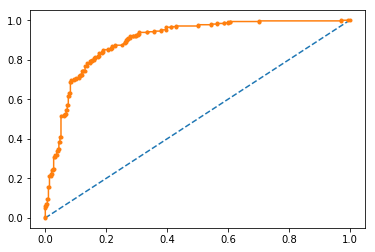

In [240]:
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
# calculate roc curve
fpr, tpr, thresholds = roc_curve(Y_test_TV_clntxt, probs, pos_label='1')
# plot no skill
pyplot.plot([0, 1], [0, 1], linestyle='--')
# plot the precision-recall curve for the model
pyplot.plot(fpr, tpr, marker='.')
# show the plot
pyplot.show()

In [118]:
#Converting to dictory 
Unseen_test = Unseen_test.reset_index().to_dict(orient='list')

In [119]:
## We are trying to create four seperate lists for text with stop words, text without stop words,
## text with stemmed words and text with lemmatized words.

## Naming Conventions followed ####

## 'clean' word is appended to lists which do not contain stopwords

## 'all' keyword is appended to lists which contain stopwords.

## use extend so it's a big flat list of vocab

Unseen_test['clean_text_stemmed'] = []
Unseen_test['clean_text_lemmatized'] = []
Unseen_test['text_stemmed'] = []
Unseen_test['text_lemmatized'] = []

vocab_stemmed = []

vocab_tokenized = []
allvocab_tokenized = []

vocab_lemmatized = []
allvocab_lemmatized = []


for idx,text in enumerate(Unseen_test['review']):

## first convert the entire text into spacy document type
#     print(f"The type of text is {type(text)} and text is {text}")
#     print(f"The type of idx is {type(idx)} and idx is {idx}")
    doc = nlp(text)
    print(f"processing {idx} document")
    words_stemmed = tokenize_and_stem(doc)
    words_lemmatized = tokenize_and_lemmatize(doc)
    vocab_stemmed.extend(words_stemmed)
    vocab_lemmatized.extend(words_lemmatized)
    
    Unseen_test['clean_text_stemmed'].append(words_stemmed)
    Unseen_test['clean_text_lemmatized'].append(words_lemmatized)
    
    allwords_stemmed = tokenize_and_stem(doc, False) 
    allwords_lemmatized = tokenize_and_lemmatize(doc, False)
    allvocab_lemmatized.extend(allwords_lemmatized)
    
    Unseen_test['text_stemmed'].append(allwords_stemmed)
    Unseen_test['text_lemmatized'].append(allwords_lemmatized)
    
    allwords_tokenized = tokenize_only(doc,False)
    allvocab_tokenized.extend(allwords_tokenized)
    
    words_tokenized = tokenize_only(doc)
    vocab_tokenized.extend(words_tokenized)

processing 0 document
processing 1 document
processing 2 document
processing 3 document
processing 4 document
processing 5 document
processing 6 document
processing 7 document
processing 8 document
processing 9 document
processing 10 document
processing 11 document
processing 12 document
processing 13 document
processing 14 document
processing 15 document
processing 16 document
processing 17 document
processing 18 document
processing 19 document
processing 20 document
processing 21 document
processing 22 document
processing 23 document
processing 24 document
processing 25 document
processing 26 document
processing 27 document
processing 28 document
processing 29 document
processing 30 document
processing 31 document
processing 32 document
processing 33 document
processing 34 document
processing 35 document
processing 36 document
processing 37 document
processing 38 document
processing 39 document
processing 40 document
processing 41 document
processing 42 document
processing 43 documen

processing 686 document
processing 687 document
processing 688 document
processing 689 document
processing 690 document
processing 691 document
processing 692 document
processing 693 document
processing 694 document
processing 695 document
processing 696 document
processing 697 document
processing 698 document
processing 699 document
processing 700 document
processing 701 document
processing 702 document
processing 703 document
processing 704 document
processing 705 document
processing 706 document
processing 707 document
processing 708 document
processing 709 document
processing 710 document
processing 711 document
processing 712 document
processing 713 document
processing 714 document
processing 715 document
processing 716 document
processing 717 document
processing 718 document
processing 719 document
processing 720 document
processing 721 document
processing 722 document
processing 723 document
processing 724 document
processing 725 document
processing 726 document
processing 727 d

In [120]:
## tfidf vectorizer needs sentence and not token. Hence we need to combine all the tokens back to form a string

Unseen_test['clean_text_stemmed'] = [' '.join(text) for text in Unseen_test['clean_text_stemmed']]
Unseen_test['clean_text_lemmatized'] = [' '.join(text) for text in Unseen_test['clean_text_lemmatized']]

In [121]:


# #define vectorizer parameters
# tfidf_vectorizer = TfidfVectorizer(max_df=0.95, max_features=5000,
#                                  min_df=0.001,
#                                  use_idf=True, ngram_range=(1,5))


tfidf_matrix_unseen = tfidf_vectorizer.transform(Unseen_test['clean_text_lemmatized'])

print(tfidf_matrix_unseen.shape)

(1200, 3525)


In [122]:
TV_Matrix_unseen = tfidf_matrix_unseen.todense()
TV_Matrix_unseen

matrix([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]])

In [123]:
#For TFid vector
TV_Mat_unseen = pd.DataFrame(TV_Matrix_unseen)
TV_Mat_unseen.head()

,0,1,2,3,4,5,6,7,8,9,...,3515,3516,3517,3518,3519,3520,3521,3522,3523,3524
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.250207,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [128]:
GBM_pred_unseen = GBM.predict(TV_Mat_unseen)

In [40]:
GBM_pred_unseen = pd.DataFrame(GBM_pred_unseen)

In [43]:
GBM_pred_unseen.head(3)

,0
0,0
1,0
2,0


In [44]:
#Exporting LSTM model output to CSV file. 
GBM_pred_unseen.to_csv("GBM_output.csv")

### Experiment with Hyperparameters

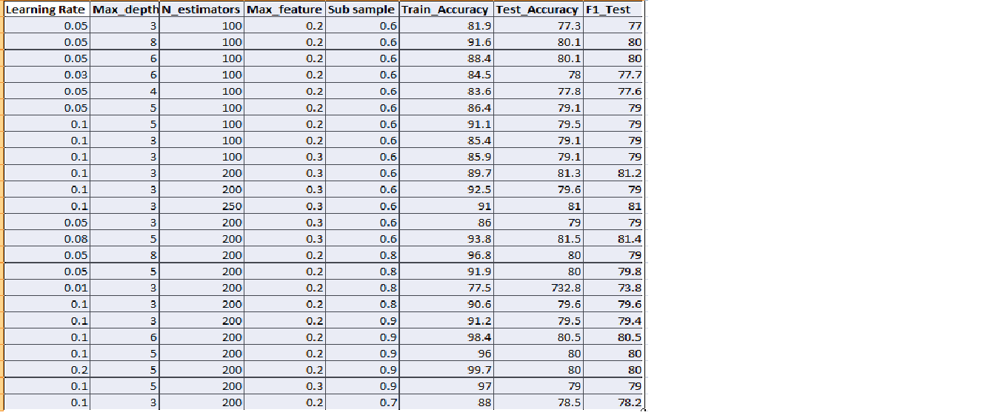

In [127]:
from IPython.display import display, Image
Image("D:\Data_science\PHD\Hyperparametertuning.png")

## Idea Generation from HyperParameter experiement 

### To avoid overfitting - You can tune with below ideas. 

Max_features should be low - Typically 0.2-0.3

Subsampling should be high - Typically 0.6-0.8

N-estimators should be low - Typically 100-300

Max_depth should be low - Typically 3-8

Learning rate should be low - Typically 0.1 - 0.01

### To increase Training accuracy - You can tune with below ideas. 

Max_features should be high - Typically 0.4-0.6

Subsampling should be low - Typically 0.3-0.5 

N-estimators should be low - Typically 500-1000

Max_depth should be low - Typically 10-20

Learning rate should be low - Typically 0.1 - 1

## 10G. XG Boost Model classifier

In [ ]:
!pip install xgboost

In [51]:
import xgboost as xgb
from xgboost.sklearn import XGBClassifier

In [52]:
eval_set = [(X_train_TV_clntxt, Y_train_TV_clntxt), (X_test_TV_clntxt, Y_test_TV_clntxt)]

# fit model on training data
XG = XGBClassifier(max_depth=8,learning_rate=0.05, n_estimators=100, subsample=0.8, reg_alpha=0.6, reg_lambda=0.6, gamma=10, early_stopping_rounds=10, eval_metric="logloss", eval_set=eval_set, verbose=True)
%time XG.fit(X_train_TV_clntxt,Y_train_TV_clntxt)

Wall time: 1min 25s


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, early_stopping_rounds=10,
              eval_metric='logloss',
              eval_set=[(      0     1     2     3     4     5     6         7     8        9     ...  \
1936   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.000000   0.0  0.00000  ...   
85     0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.000000   0.0  0.00000  ...   
2045   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.000000   0.0  0.00000  ...   
1230   0.0   0.0   0.0   0.0   0.0   0.0   0.0  0.000000   0.0  0....
1194    0
       ..
2041    1
664     0
1318    0
723     0
2863    1
Name: Sentiment, Length: 600, dtype: object)],
              gamma=10, learning_rate=0.05, max_delta_step=0, max_depth=8,
              min_child_weight=1, missing=None, n_estimators=100, n_jobs=1,
              nthread=None, objective='binary:logistic', random_state=0,
              reg_alpha=0.6, reg_lambda=0.6, scale_pos_wei

In [53]:
XG_pred_train = XG.predict(X_train_TV_clntxt)
XG_pred_test = XG.predict(X_test_TV_clntxt)


confusion_matrix_XG_train =confusion_matrix(Y_train_TV_clntxt, XG_pred_train)

confusion_matrix_XG_test= confusion_matrix(Y_test_TV_clntxt, XG_pred_test)

In [54]:

### Train data accuracy
print("\n\n--------------------------------------\n\n")
confusion_matrix_XG_train
print("Train Conf Matrix : \n", confusion_matrix_XG_train)
print("\nTrain DATA ACCURACY",accuracy_score(Y_train_TV_clntxt,XG_pred_train))
print("\nTrain data f1-score for class '1'",f1_score(Y_train_TV_clntxt,XG_pred_train, average='weighted'))


### Test data accuracy
print("\n\n--------------------------------------\n\n")

print("TEST Conf Matrix : \n", confusion_matrix_XG_test)
print("\nTEST DATA ACCURACY",accuracy_score(Y_test_TV_clntxt,XG_pred_test))
print("\nTest data f1-score for class '1'",f1_score(Y_test_TV_clntxt,XG_pred_test, average='weighted'))



--------------------------------------




array([[ 886,  323],
       [ 148, 1043]], dtype=int64)

Train Conf Matrix : 
 [[ 886  323]
 [ 148 1043]]

Train DATA ACCURACY 0.80375

Train data f1-score for class '1' 0.8028098711831237


--------------------------------------


TEST Conf Matrix : 
 [[190 101]
 [ 39 270]]

TEST DATA ACCURACY 0.7666666666666667

Test data f1-score for class '1' 0.763393665158371


In [77]:
XG_pred_train

array(['1', '0', '1', ..., '1', '0', '1'], dtype=object)

## 10H. CNN model building

In [102]:
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D, Conv1D, MaxPooling1D

In [81]:
input_shape = TV_Mat_clntxt.shape

In [103]:
modelcnn= Sequential()
modelcnn.add(Embedding(20000, 100, input_length=500))
modelcnn.add(Dropout(0.1))
modelcnn.add(Conv1D(128, 5, activation='relu'))
modelcnn.add(MaxPooling1D(pool_size=4))
modelcnn.add(LSTM(100))
modelcnn.add(Dense(2, activation='softmax'))
modelcnn.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

W0829 21:40:14.629139 12536 deprecation_wrapper.py:119] From C:\Users\Lokesh\Anaconda3\lib\site-packages\keras\backend\tensorflow_backend.py:3976: The name tf.nn.max_pool is deprecated. Please use tf.nn.max_pool2d instead.

W0829 21:40:50.947216 12536 deprecation_wrapper.py:119] From C:\Users\Lokesh\Anaconda3\lib\site-packages\keras\optimizers.py:790: The name tf.train.Optimizer is deprecated. Please use tf.compat.v1.train.Optimizer instead.

W0829 21:40:51.024220 12536 deprecation_wrapper.py:119] From C:\Users\Lokesh\Anaconda3\lib\site-packages\keras\backend\tensorflow_backend.py:3376: The name tf.log is deprecated. Please use tf.math.log instead.

W0829 21:40:51.039221 12536 deprecation.py:323] From C:\Users\Lokesh\Anaconda3\lib\site-packages\tensorflow\python\ops\nn_impl.py:180: add_dispatch_support.<locals>.wrapper (from tensorflow.python.ops.array_ops) is deprecated and will be removed in a future version.
Instructions for updating:
Use tf.where in 2.0, which has the same broadcas

In [104]:
modelcnn.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_3 (Embedding)      (None, 500, 100)          2000000   
_________________________________________________________________
dropout_3 (Dropout)          (None, 500, 100)          0         
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 496, 128)          64128     
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 124, 128)          0         
_________________________________________________________________
lstm_1 (LSTM)                (None, 100)               91600     
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 202       
Total params: 2,155,930
Trainable params: 2,155,930
Non-trainable params: 0
_________________________________________________________________


In [108]:
hist = modelcnn.fit(X_train, Y_train, batch_size=32, epochs=5, verbose=1, validation_data=(X_test, Y_test))

Train on 2400 samples, validate on 600 samples
Epoch 1/5
2400/2400 [==============================] - ETA: 7:28 - loss: 0.6965 - acc: 0.375 - ETA: 3:59 - loss: 0.6849 - acc: 0.531 - ETA: 2:47 - loss: 0.7030 - acc: 0.479 - ETA: 2:10 - loss: 0.6941 - acc: 0.523 - ETA: 1:47 - loss: 0.6951 - acc: 0.518 - ETA: 1:32 - loss: 0.6972 - acc: 0.510 - ETA: 1:21 - loss: 0.7013 - acc: 0.486 - ETA: 1:13 - loss: 0.6993 - acc: 0.492 - ETA: 1:06 - loss: 0.6967 - acc: 0.500 - ETA: 1:01 - loss: 0.6939 - acc: 0.509 - ETA: 57s - loss: 0.6931 - acc: 0.508 - ETA: 54s - loss: 0.6923 - acc: 0.50 - ETA: 51s - loss: 0.6905 - acc: 0.51 - ETA: 48s - loss: 0.6891 - acc: 0.52 - ETA: 46s - loss: 0.6883 - acc: 0.52 - ETA: 44s - loss: 0.6878 - acc: 0.53 - ETA: 42s - loss: 0.6862 - acc: 0.54 - ETA: 40s - loss: 0.6857 - acc: 0.54 - ETA: 39s - loss: 0.6839 - acc: 0.55 - ETA: 37s - loss: 0.6849 - acc: 0.54 - ETA: 36s - loss: 0.6839 - acc: 0.55 - ETA: 35s - loss: 0.6814 - acc: 0.56 - ETA: 34s - loss: 0.6773 - acc: 0.57 - ETA

2400/2400 [==============================] - ETA: 31s - loss: 0.0943 - acc: 0.96 - ETA: 31s - loss: 0.0598 - acc: 0.98 - ETA: 31s - loss: 0.0721 - acc: 0.97 - ETA: 31s - loss: 0.0689 - acc: 0.98 - ETA: 30s - loss: 0.0713 - acc: 0.98 - ETA: 30s - loss: 0.0706 - acc: 0.98 - ETA: 29s - loss: 0.0653 - acc: 0.98 - ETA: 29s - loss: 0.0619 - acc: 0.98 - ETA: 28s - loss: 0.0675 - acc: 0.98 - ETA: 27s - loss: 0.0673 - acc: 0.98 - ETA: 26s - loss: 0.0670 - acc: 0.98 - ETA: 26s - loss: 0.0719 - acc: 0.98 - ETA: 25s - loss: 0.0674 - acc: 0.98 - ETA: 24s - loss: 0.0662 - acc: 0.98 - ETA: 24s - loss: 0.0636 - acc: 0.98 - ETA: 23s - loss: 0.0608 - acc: 0.98 - ETA: 23s - loss: 0.0641 - acc: 0.98 - ETA: 23s - loss: 0.0623 - acc: 0.98 - ETA: 22s - loss: 0.0625 - acc: 0.98 - ETA: 22s - loss: 0.0648 - acc: 0.98 - ETA: 21s - loss: 0.0633 - acc: 0.98 - ETA: 21s - loss: 0.0637 - acc: 0.98 - ETA: 20s - loss: 0.0626 - acc: 0.98 - ETA: 20s - loss: 0.0639 - acc: 0.98 - ETA: 20s - loss: 0.0638 - acc: 0.98 - ETA: 

In [110]:
score = modelcnn.evaluate(X_test, Y_test, batch_size=32)

print('Test Loss:', score[0])
print('Test Accuracy:', score[1])

600/600 [==============================] - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - ETA:  - 1s 2ms/step
Test Loss: 0.8535148517290752
Test Accuracy: 0.7849999992052714


In [111]:
Y_pred = modelcnn.predict(X_test)
print(Y_pred)

[[9.9848491e-01 1.5150915e-03]
 [9.8279220e-01 1.7207809e-02]
 [9.9948126e-01 5.1872607e-04]
 ...
 [1.8794717e-02 9.8120534e-01]
 [5.4257847e-02 9.4574213e-01]
 [1.5789610e-01 8.4210390e-01]]


In [112]:
y_pred = np.argmax(Y_pred, axis=1)
print(y_pred)

[0 0 0 0 1 1 0 0 0 1 1 1 0 0 0 1 1 0 0 0 0 0 1 0 1 1 0 1 1 1 1 1 0 0 1 0 0
 1 1 0 0 1 1 1 1 0 0 0 0 1 0 0 1 0 1 1 1 0 0 1 0 1 0 1 0 1 1 0 1 1 1 0 1 0
 0 1 0 0 0 0 1 0 0 0 0 1 0 1 0 1 0 1 0 1 1 1 0 1 1 0 1 0 1 0 0 0 0 0 1 1 1
 0 1 1 0 1 1 1 1 0 1 1 0 0 0 0 1 0 1 0 1 1 1 1 0 1 0 1 0 1 1 1 0 0 0 0 1 0
 1 0 1 0 0 1 0 0 0 1 0 1 1 1 1 1 1 1 0 1 1 0 0 0 0 0 0 0 1 1 0 0 0 1 0 1 0
 0 1 0 1 1 1 1 0 0 1 0 0 1 0 1 1 0 1 1 0 0 0 0 1 1 0 0 1 1 1 0 0 0 0 1 0 0
 1 1 1 1 1 0 0 1 0 1 0 0 1 0 1 0 0 1 1 1 0 0 0 0 0 1 0 1 0 0 0 1 0 1 0 1 1
 1 1 1 1 1 0 1 1 0 1 1 1 0 0 1 1 1 1 1 0 0 0 0 1 1 1 0 0 1 1 1 0 0 0 0 0 0
 0 1 1 1 0 0 1 0 1 0 1 1 0 1 1 0 0 0 0 0 0 1 1 1 0 0 0 1 1 0 1 1 0 0 0 1 1
 0 1 1 1 1 1 1 0 1 0 1 0 1 0 0 0 0 0 1 1 1 0 0 1 0 1 0 0 0 0 1 1 0 1 0 1 0
 1 0 0 0 1 0 1 1 0 1 0 0 0 0 1 0 0 0 0 0 1 0 0 0 1 0 0 1 1 0 1 1 1 0 0 1 0
 0 0 0 1 0 1 0 1 1 1 1 1 0 0 0 0 0 1 0 1 1 1 0 1 1 0 0 1 1 1 1 1 0 1 1 0 0
 1 0 1 0 1 0 1 1 1 1 1 0 0 0 1 1 0 0 1 1 0 1 0 1 1 1 0 0 1 0 0 0 1 0 0 0 0
 0 0 0 1 0 1 1 0 1 0 0 1 

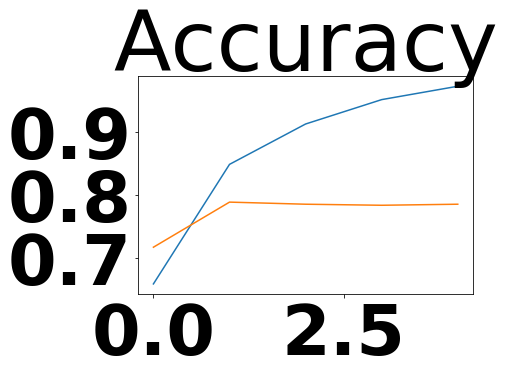

In [115]:
plt.title('Accuracy')
plt.plot(hist.history['acc'], label='train')
plt.plot(hist.history['val_acc'], label='test')

plt.show();

## 10I. Stacking Model

In [77]:
from scipy.stats import mode


In [ ]:
stack = StackingCVClassifier(lr_pred_tv_test_clntxt,NB_pred_test,rf_pred_test, dtc_pred_test, GBM_pred_test)
stack.fit(X_train_TV_clntxt, Y_train_TV_clntxt)`

In [ ]:
stack.predict(X_train_TV_clntxt)
stack.predict(X_test_TV_clntxt)

In [ ]:
stack.predict(TV_Mat_unseen)

In [61]:
stack_test = np.array([lr_pred_tv_test_clntxt,NB_pred_test,rf_pred_test, dtc_pred_test, GBM_pred_test]).T
stack_train = np.array([lr_pred_tv_train_clntxt,NB_pred_train,rf_pred_train, dtc_pred_train, GBM_pred_train]).T
stacked_pred_train = mode(stack_train,axis=1)[0]
stacked_pred_test = mode(stack_test,axis=1)[0]

In [62]:
### Train data accuracy
print("\n\n--------------------------------------\n\n")

print("TEST DATA ACCURACY",accuracy_score(Y_train_TV_clntxt,stacked_pred_train))
print("\nTrain DATA ACCURACY",accuracy_score(Y_train_TV_clntxt,stacked_pred_train))
print("\nTrain data f1-score for class '1'",f1_score(Y_train_TV_clntxt,stacked_pred_train, average='weighted'))

### Test data accuracy
print("\n\n--------------------------------------\n\n")
print("TEST DATA ACCURACY",accuracy_score(Y_test_TV_clntxt,stacked_pred_test))
print("\nTest data f1-score for class '1'",f1_score(Y_test_TV_clntxt,stacked_pred_test,pos_label='1'))
print("\nTest data f1-score for class '2'",f1_score(Y_test_TV_clntxt,stacked_pred_test,pos_label='0'))



--------------------------------------


TEST DATA ACCURACY 0.90875

Train DATA ACCURACY 0.90875

Train data f1-score for class '1' 0.9087206068130811


--------------------------------------


TEST DATA ACCURACY 0.8216666666666667

Test data f1-score for class '1' 0.834108527131783

Test data f1-score for class '2' 0.8072072072072072


In [149]:
stack_unseen = np.array([lr_pred_unseen,NB_pred_unseen,rf_pred_unseen, dtc_pred_unseen, GBM_pred_unseen]).T


In [150]:
stack_unseen= pd.DataFrame(stack_unseen)

In [151]:
stack_unseen.head(3)

,0,1,2,3,4
0,0,0,0,0,0
1,0,0,0,0,0
2,0,0,0,0,0


In [161]:
stacked_pred_unseen  = mode(stack_unseen,axis=1)[0]

In [165]:
stacked_pred_unseen.head()

,0
0,0
1,0
2,0
3,0
4,0


In [163]:
stacked_pred_unseen = pd.DataFrame(stacked_pred_unseen)

In [166]:
stacked_pred_unseen.to_csv("stacking_out.csv")

## ModelPerformance

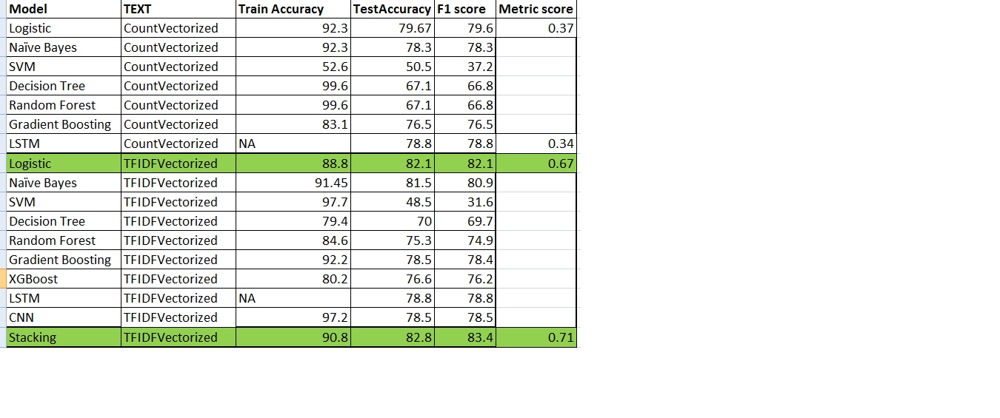

In [63]:
from IPython.display import display, Image
Image("D:\Data_science\PHD\modelperformance.png")

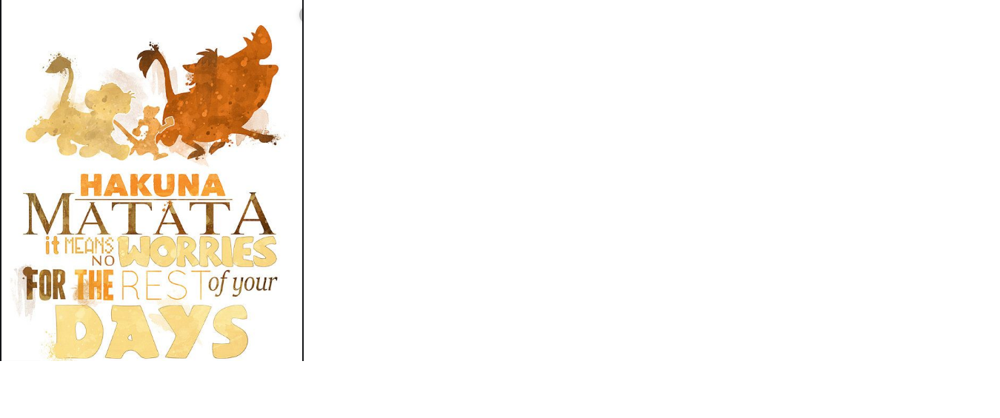

In [69]:
from IPython.display import display, Image
Image("D:\Data_science\PHD\hakunamatata1.png")

# Wishing you Hakuna Matata for rest of your Days!

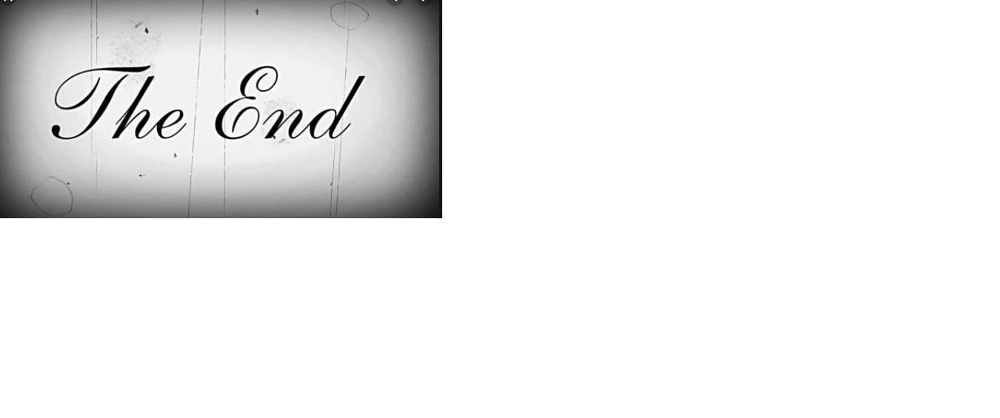

In [70]:
from IPython.display import display, Image
Image("D:\Data_science\PHD\Theend.png")